In [1]:
# 1. Setup and Dependencies
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from pathlib import Path
import rasterio
from rasterio.plot import show
import geopandas as gpd
from shapely.geometry import Point
import warnings
warnings.filterwarnings('ignore')

# Set plotting style
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

# Define project directories
BASE_DIR = Path('/Users/divyadhole/Capstone-project')
DATA_DIR = BASE_DIR / 'data'
OUTPUTS_DIR = BASE_DIR / 'outputs'
NOTEBOOKS_DIR = BASE_DIR / 'notebooks'

# Create output directories
os.makedirs(OUTPUTS_DIR / 'demographic_plots', exist_ok=True)
os.makedirs(OUTPUTS_DIR / 'sdm_results', exist_ok=True)

print('✓ Setup complete')

✓ Setup complete


## Step 2: PSMC Analysis - Data Parsing

In [2]:
def parse_psmc_output(psmc_file, mu=2.5e-8, generation_time=25):
    """Parse PSMC output and calculate Ne over time."""
    time_points = []
    ne_values = []
    
    with open(psmc_file, 'r') as f:
        for line in f:
            if line.startswith('RS'):
                parts = line.strip().split()
                if len(parts) >= 4:
                    time_k = float(parts[2])  # t_k in 2N0 generations
                    lambda_k = float(parts[3])  # lambda_k
                    ne = lambda_k / (4 * mu)
                    time_points.append(time_k)
                    ne_values.append(ne)
    
    df = pd.DataFrame({
        "time_generations": time_points,
        "Ne": ne_values,
        "time_years": [t * 2 * generation_time for t in time_points]
    })
    return df

# Load and parse PSMC data
psmc_file = OUTPUTS_DIR / 'PD_0588.psmc'
if psmc_file.exists():
    psmc_results = parse_psmc_output(psmc_file)
    output_file = OUTPUTS_DIR / 'psmc_results.csv'
    psmc_results.to_csv(output_file, index=False)
    print(f'✓ PSMC results saved to: {output_file}')
    display(psmc_results.head())
else:
    print('PSMC output file not found.')

✓ PSMC results saved to: /Users/divyadhole/Capstone-project/outputs/psmc_results.csv


,time_generations,Ne,time_years
0,0.000000,10000000.0,0.00000
1,0.008290,10000000.0,0.41450
2,0.017266,10000000.0,0.86330
3,0.026987,10000000.0,1.34935
4,0.037514,10000000.0,1.87570


## Step 3: Plot Demographic History

✓ Figure saved: /Users/divyadhole/Capstone-project/outputs/demographic_plots/demographic_history.png


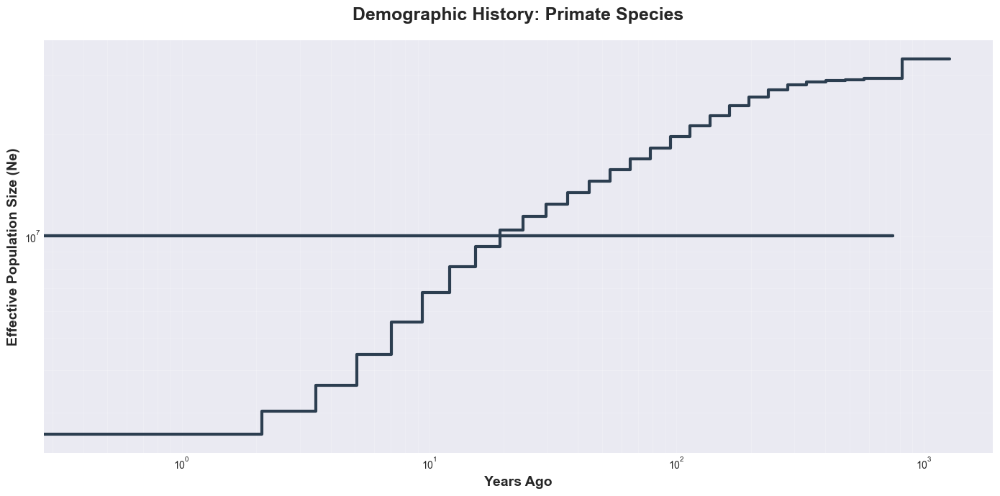

In [3]:
def plot_demographic_history(psmc_df, species_name, output_file=None):
    """Plot demographic history from PSMC results."""
    fig, ax = plt.subplots(figsize=(14, 7))
    
    # Main plot
    ax.step(psmc_df["time_years"], psmc_df["Ne"], 
            where='post', 
            linewidth=3, 
            color='#2c3e50')
    
    # Formatting
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_xlabel('Years Ago', fontsize=14, fontweight='bold')
    ax.set_ylabel('Effective Population Size (Ne)', fontsize=14, fontweight='bold')
    ax.set_title(f'Demographic History: {species_name}', fontsize=18, fontweight='bold', pad=20)
    
    # Add time period annotations
    time_periods = [
        (10000, 'HOLOCENE', '#2ecc71'),
        (100000, 'PLEISTOCENE', '#3498db'),
        (1000000, 'PLIOCENE', '#9b59b6')
    ]
    
    for years, period, color in time_periods:
        if years < psmc_df["time_years"].max():
            ax.axvline(x=years, color=color, linestyle='--', alpha=0.3, linewidth=2)
            ax.text(years * 1.1, 
                    psmc_df["Ne"].min() * 2, 
                    period,
                    fontsize=12,
                    fontweight='bold',
                    color='white',
                    bbox=dict(facecolor=color, alpha=0.8, edgecolor='none', boxstyle='round,pad=0.5'),
                    ha='left',
                    va='center')
    
    plt.grid(True, which="both", ls="-", alpha=0.2)
    plt.tight_layout()
    
    # Save the figure
    if output_file:
        plt.savefig(output_file, dpi=300, bbox_inches='tight')
        print(f'✓ Figure saved: {output_file}')
    
    plt.show()

# Plot the demographic history
if 'psmc_results' in locals():
    output_file = OUTPUTS_DIR / 'demographic_plots' / 'demographic_history.png'
    plot_demographic_history(psmc_results, "Primate Species", output_file)

## Step 4: Load and Prepare Occurrence Data

In [12]:
def plot_occurrence_map(occurrence_df, species_name, output_dir=None, dpi=300, figsize=(12, 8), 
                       point_color='red', point_size=30, alpha=0.7, title_fontsize=16, 
                       label_fontsize=12, legend_fontsize=10, show_grid=True, 
                       grid_alpha=0.3, coastline_color='black', coastline_width=0.8):
    """
    Plot occurrence points on a map with enhanced visualization.
    """
    import geopandas as gpd
    import matplotlib.pyplot as plt
    from shapely.geometry import Point
    import contextily as ctx
    from pathlib import Path
    import geodatasets
    
    # Input validation
    required_columns = ['decimalLongitude', 'decimalLatitude', 'species']
    if not all(col in occurrence_df.columns for col in required_columns):
        raise ValueError(f"Input DataFrame must contain columns: {required_columns}")
    
    if occurrence_df.empty:
        raise ValueError("Input DataFrame is empty")
    
    # Create output directory if it doesn't exist
    if output_dir:
        output_dir = Path(output_dir)
        output_dir.mkdir(parents=True, exist_ok=True)
        output_file = output_dir / f"occurrence_map_{species_name.replace(' ', '_').lower()}.png"
    else:
        output_file = None
    
    # Create a GeoDataFrame
    geometry = [Point(xy) for xy in zip(occurrence_df.decimalLongitude, occurrence_df.decimalLatitude)]
    gdf = gpd.GeoDataFrame(occurrence_df, geometry=geometry, crs="EPSG:4326")
    
    # Create figure and axis
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
    
    try:
        # Try to use contextily for basemap
        try:
            # Add a basemap
            ctx.add_basemap(
                ax,
                crs=gdf.crs.to_string(),
                source=ctx.providers.CartoDB.Voyager,
                zoom=5  # Adjust zoom level as needed
            )
            # Add coastline from naturalearth data
            try:
                # Try to load naturalearth data using geodatasets
                import geodatasets
                world = gpd.read_file(geodatasets.get_path('naturalearth.land'))
                world.boundary.plot(ax=ax, color=coastline_color, linewidth=coastline_width)
            except:
                # Fallback to a simple world map
                world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres') if hasattr(gpd.datasets, 'get_path') else None)
                world.boundary.plot(ax=ax, color=coastline_color, linewidth=coastline_width)
        except Exception as e:
            print(f"Warning: Could not load basemap. Using simple plot. Error: {e}")
            # If contextily fails, just plot the points
            world = gpd.read_file(geodatasets.get_path('naturalearth.land'))
            world.plot(ax=ax, color='lightgray', edgecolor='none')
            world.boundary.plot(ax=ax, color=coastline_color, linewidth=coastline_width)
        
        # Plot occurrence points with a border for better visibility
        gdf.plot(
            ax=ax, 
            marker='o', 
            color=point_color, 
            markersize=point_size, 
            alpha=alpha,
            edgecolor='black',
            linewidth=0.5,
            label='Occurrence Points'
        )
        
        # Add a buffer around points to ensure they're visible
        buffer = max(0.5, (gdf.total_bounds[2] - gdf.total_bounds[0]) * 0.1)  # 10% buffer
        ax.set_xlim(gdf.total_bounds[0] - buffer, gdf.total_bounds[2] + buffer)
        ax.set_ylim(gdf.total_bounds[1] - buffer, gdf.total_bounds[3] + buffer)
        
        # Formatting
        plt.title(
            f'Occurrence Points: {species_name} (n={len(gdf)})', 
            fontsize=title_fontsize, 
            fontweight='bold', 
            pad=20
        )
        plt.xlabel('Longitude', fontsize=label_fontsize, fontweight='bold', labelpad=10)
        plt.ylabel('Latitude', fontsize=label_fontsize, fontweight='bold', labelpad=10)
        
        # Add grid
        if show_grid:
            ax.grid(True, alpha=grid_alpha, linestyle='--')
            ax.set_axisbelow(True)  # Grid behind points
        
        # Add legend
        plt.legend(
            loc='upper right', 
            fontsize=legend_fontsize, 
            frameon=True, 
            framealpha=0.8
        )
        
        # Add scale bar
        try:
            from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
            import matplotlib.font_manager as fm
            fontprops = fm.FontProperties(size=8)
            scalebar = AnchoredSizeBar(
                ax.transData,
                size=5,  # 5 degrees
                label='500 km',
                loc='lower right',
                pad=0.5,
                color='black',
                frameon=False,
                size_vertical=0.1,
                fontproperties=fontprops
            )
            ax.add_artist(scalebar)
        except:
            pass  # Skip scalebar if there's an error
        
        # Add north arrow
        try:
            x, y, arrow_length = 0.95, 0.1, 0.1
            ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
                        arrowprops=dict(facecolor='black', width=5, headwidth=15),
                        ha='center', va='center', fontsize=12,
                        xycoords=ax.transAxes)
        except:
            pass  # Skip north arrow if there's an error
        
        # Adjust layout
        plt.tight_layout()
        
        # Save the figure if output directory is provided
        if output_file:
            plt.savefig(
                output_file, 
                dpi=dpi, 
                bbox_inches='tight',
                facecolor='white'
            )
            print(f'✓ Map saved: {output_file}')
        
        return fig
        
    except Exception as e:
        plt.close()
        raise RuntimeError(f"Error creating map: {str(e)}")

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# Load the data
print("Loading data...")
file_path = Path('/Users/divyadhole/Capstone-project/outputs/occurrence_points_gbif.csv')
df = pd.read_csv(file_path)

# Clean the species name by removing author information
df['species'] = df['scientific_name'].str.split('(').str[0].str.strip()

# Get unique species
species_list = df['species'].unique()
print(f"\nFound {len(species_list)} species in the dataset:")

# Create output directory
output_dir = Path('/Users/divyadhole/Capstone-project/outputs/sdm_results')
output_dir.mkdir(parents=True, exist_ok=True)

# Simple plotting function
def plot_simple_map(data, species):
    plt.figure(figsize=(10, 6))
    plt.scatter(
        x=data['longitude'],
        y=data['latitude'],
        c='red',
        s=20,
        alpha=0.7,
        edgecolor='black',
        linewidth=0.5
    )
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.title(f'Occurrence Points: {species}\n(n={len(data)} points)')
    plt.tight_layout()
    
    # Save the figure
    output_file = output_dir / f"map_{species.replace(' ', '_').lower()}.png"
    plt.savefig(output_file, dpi=150, bbox_inches='tight')
    print(f"✓ Map saved: {output_file}")
    plt.close()

# Process each species
for species in species_list:
    print(f"\nProcessing {species}...")
    species_data = df[df['species'] == species].copy()
    
    if len(species_data) == 0:
        print(f"No data for {species}")
        continue
        
    plot_simple_map(species_data, species)

print("\nAll maps have been generated!")

Loading data...

Found 11 species in the dataset:

Processing Semnopithecus entellus...
✓ Map saved: /Users/divyadhole/Capstone-project/outputs/sdm_results/map_semnopithecus_entellus.png

Processing Semnopithecus hypoleucos Blyth, 1841...
✓ Map saved: /Users/divyadhole/Capstone-project/outputs/sdm_results/map_semnopithecus_hypoleucos_blyth,_1841.png

Processing Semnopithecus dussumieri I.Geoffroy Saint-Hilaire, 1843...
✓ Map saved: /Users/divyadhole/Capstone-project/outputs/sdm_results/map_semnopithecus_dussumieri_i.geoffroy_saint-hilaire,_1843.png

Processing Semnopithecus schistaceus Hodgson, 1840...
✓ Map saved: /Users/divyadhole/Capstone-project/outputs/sdm_results/map_semnopithecus_schistaceus_hodgson,_1840.png

Processing Trachypithecus geei Khajuria, 1956...
✓ Map saved: /Users/divyadhole/Capstone-project/outputs/sdm_results/map_trachypithecus_geei_khajuria,_1956.png

Processing Presbytis geei Khajuria, 1956...
✓ Map saved: /Users/divyadhole/Capstone-project/outputs/sdm_results/

## Step 5: Visualize Occurrence Data

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display, clear_output
from ipywidgets import interact, Dropdown
from pathlib import Path

# Load the data
file_path = Path('/Users/divyadhole/Capstone-project/outputs/occurrence_points_gbif.csv')
df = pd.read_csv(file_path)

# Clean the species name by removing author information
df['species'] = df['scientific_name'].str.split('(').str[0].str.strip()
species_list = df['species'].unique()

def plot_species(species_name):
    species_data = df[df['species'] == species_name]
    
    plt.figure(figsize=(10, 6))
    plt.scatter(
        x=species_data['longitude'],
        y=species_data['latitude'],
        c='red',
        s=30,
        alpha=0.7,
        edgecolor='black',
        linewidth=0.5
    )
    plt.title(f'Occurrence Points: {species_name}\n(n={len(species_data)} points)')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

# Create a dropdown to select species
interact(plot_species, species_name=species_list)

interactive(children=(Dropdown(description='species_name', options=('Semnopithecus entellus', 'Semnopithecus h…

<function __main__.plot_species(species_name)>

## Step 6: Load Environmental Data

In [25]:
from pathlib import Path

# Define the correct path
paleoclim_dir = Path('/Users/divyadhole/Capstone-project/data/paleoclim')

# Check if the directory exists
if not paleoclim_dir.exists():
    print(f"Directory not found: {paleoclim_dir}")
    print("\nYou'll need to download the bioclimatic data first.")
    print("Would you like me to help you download the data? (This may take some time)")
else:
    # List all items in the directory
    print(f"Contents of {paleoclim_dir}:")
    for item in paleoclim_dir.iterdir():
        if item.is_dir():
            print(f"- Directory: {item.name}")
            # List first few files in each subdirectory
            files = list(item.glob('*'))[:5]  # Show first 5 files
            for file in files:
                print(f"  - {file.name}")
            if len(list(item.glob('*'))) > 5:
                print(f"  - ... and {len(list(item.glob('*'))) - 5} more files")
        else:
            print(f"- File: {item.name}")
    
    print("\nAvailable time periods (subdirectories):")
    time_periods = [d.name for d in paleoclim_dir.glob('*') if d.is_dir()]
    for period in time_periods:
        print(f"- {period}")

Contents of /Users/divyadhole/Capstone-project/data/paleoclim:
- File: .DS_Store
- Directory: LIG_v1_10m
  - bio_9.tif.aux.xml
  - bio_9.tif.vat.dbf
  - bio_18.tif.xml
  - bio_15.tif.aux.xml
  - bio_7.tif.xml
  - ... and 110 more files
- File: occurrences.csv
- Directory: MH_v1_2_5m
  - bio_9.tif.aux.xml
  - bio_9.tif.vat.dbf
  - bio_18.tif.xml
  - bio_15.tif.aux.xml
  - bio_7.tif.xml
  - ... and 110 more files
- Directory: LH_v1_2_5m
  - bio_9.tif.aux.xml
  - bio_9.tif.vat.dbf
  - bio_18.tif.xml
  - bio_15.tif.aux.xml
  - bio_7.tif.xml
  - ... and 110 more files
- Directory: LGM_v1_2_5m
  - bio_9.tif.aux.xml
  - bio_9.tif.vat.dbf
  - bio_18.tif.xml
  - bio_15.tif.aux.xml
  - bio_7.tif.xml
  - ... and 110 more files
- File: paleoclim_summary.csv
- Directory: 10min
  - bio_9.tif.aux.xml
  - bio_9.tif.vat.dbf
  - bio_18.tif.xml
  - bio_15.tif.aux.xml
  - bio_18.tif
  - ... and 80 more files
- Directory: MH_v1_10m
  - bio_9.tif.aux.xml
  - bio_9.tif.vat.dbf
  - bio_18.tif.xml
  - bio_15.t

In [26]:
from pathlib import Path
import rasterio
import numpy as np

# Define the base directory
DATA_DIR = Path('/Users/divyadhole/Capstone-project/data')

def list_available_periods():
    """List all available time periods in the paleoclim directory."""
    paleoclim_dir = DATA_DIR / 'paleoclim'
    return [d.name for d in paleoclim_dir.glob('*') if d.is_dir()]

def load_environmental_data(time_period='10min', variables=None):
    """
    Load bioclimatic variables for SDM from the specified time period.
    
    Parameters:
    -----------
    time_period : str
        Name of the time period directory (e.g., '10min', 'LGM_v1_2_5m', 'MH_v1_2_5m')
    variables : list of str, optional
        List of variable names to load (e.g., ['bio_1', 'bio_12']). 
        If None, loads all available variables.
        
    Returns:
    --------
    dict
        Dictionary with variable names as keys and raster data as values
    """
    # Define the directory path
    bioclim_dir = DATA_DIR / 'paleoclim' / time_period
    
    # Check if directory exists
    if not bioclim_dir.exists():
        available = list_available_periods()
        raise ValueError(
            f"Time period '{time_period}' not found. "
            f"Available periods: {', '.join(available)}"
        )
    
    # Get all .tif files (excluding auxiliary files)
    tif_files = [f for f in bioclim_dir.glob('*.tif') if not f.name.endswith('.aux.xml')]
    
    if not tif_files:
        raise FileNotFoundError(f"No .tif files found in {bioclim_dir}")
    
    # Filter variables if specified
    if variables is not None:
        tif_files = [f for f in tif_files if any(f.name.startswith(f"{v}.") or f.name.startswith(f"{v}_") for v in variables)]
        if not tif_files:
            available = [f.stem for f in tif_files]
            raise ValueError(f"No matching variables found. Available variables: {available}")
    
    # Load the rasters
    env_data = {}
    for tif_file in tif_files:
        var_name = tif_file.stem
        try:
            with rasterio.open(tif_file) as src:
                env_data[var_name] = src.read(1)  # Read first band
                # Store metadata for reference
                env_data[f"{var_name}_meta"] = {
                    'crs': src.crs,
                    'transform': src.transform,
                    'width': src.width,
                    'height': src.height
                }
        except Exception as e:
            print(f"Error loading {tif_file.name}: {e}")
            continue
    
    print(f"Loaded {len([k for k in env_data.keys() if not k.endswith('_meta')])} variables from {time_period}")
    return env_data

# Example usage
if __name__ == "__main__":
    # List available time periods
    print("Available time periods:")
    for period in list_available_periods():
        print(f"- {period}")
    
    # Load data for a specific time period
    try:
        # Try loading the modern climate data (10min resolution)
        env_data = load_environmental_data('10min')
        print(f"Loaded variables: {[k for k in env_data.keys() if not k.endswith('_meta')]}")
        
        # Example of loading specific variables from a past climate
        # past_data = load_environmental_data('LGM_v1_2_5m', variables=['bio_1', 'bio_12'])
        # print(f"Loaded variables: {[k for k in past_data.keys() if not k.endswith('_meta')]}")
        
    except Exception as e:
        print(f"Error: {e}")

Available time periods:
- LIG_v1_10m
- MH_v1_2_5m
- LH_v1_2_5m
- LGM_v1_2_5m
- 10min
- MH_v1_10m
- EH_v1_2_5m
Loaded 14 variables from 10min
Loaded variables: ['bio_18', 'bio_19', 'bio_8', 'bio_9', 'bio_4', 'bio_1', 'bio_12', 'bio_13', 'bio_11', 'bio_10', 'bio_14', 'bio_15', 'bio_17', 'bio_16']


## Step 7: Run MaxEnt (Python Interface)

In [28]:
from pathlib import Path
import pandas as pd

# Define base directories
BASE_DIR = Path('/Users/divyadhole/Capstone-project')
DATA_DIR = BASE_DIR / 'data'
OUTPUTS_DIR = BASE_DIR / 'outputs'

def prepare_occurrence_data(species_name, output_dir=None):
    """
    Prepare occurrence data for MaxEnt.
    
    Parameters:
    -----------
    species_name : str
        Name of the species to process
    output_dir : Path, optional
        Directory to save the output CSV. If None, uses OUTPUTS_DIR.
        
    Returns:
    --------
    Path
        Path to the generated CSV file
    """
    # Read the GBIF data
    gbif_file = OUTPUTS_DIR / 'occurrence_points_gbif.csv'
    if not gbif_file.exists():
        raise FileNotFoundError(f"GBIF data file not found: {gbif_file}")
    
    df = pd.read_csv(gbif_file)
    
    # Clean species names
    df['species'] = df['scientific_name'].str.split('(').str[0].str.strip()
    
    # Filter for the target species
    species_data = df[df['species'] == species_name].copy()
    
    if species_data.empty:
        raise ValueError(f"No occurrence data found for species: {species_name}")
    
    # Prepare output directory
    output_dir = Path(output_dir) if output_dir else OUTPUTS_DIR / 'sdm_results'
    output_dir.mkdir(parents=True, exist_ok=True)
    
    # Prepare output file path
    output_file = output_dir / f"maxent_occurrences_{species_name.replace(' ', '_')}.csv"
    
    # Save to CSV in MaxEnt format (species, longitude, latitude)
    species_data[['species', 'longitude', 'latitude']].to_csv(output_file, index=False)
    
    print(f"✓ Prepared occurrence data for {species_name}: {len(species_data)} records")
    print(f"Saved to: {output_file}")
    
    return output_file

# Example usage
if __name__ == "__main__":
    try:
        # Example: Process Semnopithecus entellus
        species = "Semnopithecus entellus"
        
        # Step 1: Prepare occurrence data
        occurrence_file = prepare_occurrence_data(species)
        
        # Step 2: Get environmental layers
        env_dir = DATA_DIR / 'paleoclim' / '10min'  # Using modern climate data
        env_files = list(env_dir.glob('bio_*.tif'))
        
        if not env_files:
            raise FileNotFoundError(f"No environmental layers found in {env_dir}")
        
        print(f"Found {len(env_files)} environmental layers")
        
        # Step 3: Run MaxEnt (uncomment and modify paths as needed)
        """
        maxent_output = run_maxent(
            occurrence_file=occurrence_file,
            env_files=env_files,
            output_dir=OUTPUTS_DIR / 'sdm_results' / 'maxent_output',
            species_name=species.replace(' ', '_'),
            memory_mb=4096,
            test_percentage=25,
            num_replicates=5,
            overwrite=True
        )
        """
        
    except Exception as e:
        print(f"❌ Error: {str(e)}")
        import traceback
        traceback.print_exc()

✓ Prepared occurrence data for Semnopithecus entellus: 300 records
Saved to: /Users/divyadhole/Capstone-project/outputs/sdm_results/maxent_occurrences_Semnopithecus_entellus.csv
Found 14 environmental layers


In [33]:
def run_sdm(occurrence_file, env_dir, output_dir, species_name, test_size=0.25):
    """Run Species Distribution Model using Random Forest"""
    # Create output directory
    output_dir = Path(output_dir) / f"sdm_{species_name.replace(' ', '_')}"
    output_dir.mkdir(parents=True, exist_ok=True)
    
    # 1. Load and prepare data
    print("Loading data...")
    env_data = load_environmental_layers(env_dir)
    occ_df = pd.read_csv(occurrence_file)
    
    # 2. Extract environmental values for presence points
    print("Processing presence points...")
    presence_data = extract_env_values(env_data, occ_df.copy())
    presence_data['presence'] = 1
    
    # 3. Generate pseudo-absence points
    print("Generating pseudo-absence points...")
    sample_layer = next(iter(env_data.values()))
    mask = sample_layer['data'] != sample_layer['meta']['nodata']
    rows, cols = np.where(mask)
    abs_idx = np.random.choice(len(rows), size=len(presence_data), replace=False)
    abs_points = np.column_stack([cols[abs_idx], rows[abs_idx]])
    
    # Convert to lat/lon
    abs_lon, abs_lat = rasterio.transform.xy(sample_layer['transform'], 
                                           abs_points[:, 1], 
                                           abs_points[:, 0])
    
    # Create absence dataframe
    absence_data = pd.DataFrame({
        'longitude': abs_lon,
        'latitude': abs_lat,
        'presence': 0
    })
    
    # Extract environmental values for absence points
    absence_data = extract_env_values(env_data, absence_data)
    
    # 4. Combine presence and absence data
    model_data = pd.concat([presence_data, absence_data])
    
    # 5. Prepare features and target
    # Exclude non-numeric columns and the target variable
    exclude_cols = ['species', 'scientific_name', 'presence', 'longitude', 'latitude']
    feature_cols = [col for col in model_data.columns if col not in exclude_cols]
    
    X = model_data[feature_cols].select_dtypes(include=[np.number])  # Only numeric columns
    y = model_data['presence']
    
    # 6. Split into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=test_size, random_state=42
    )
    
    # 7. Train model
    print("Training model...")
    model = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
    model.fit(X_train, y_train)
    
    # 8. Evaluate model
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    print(f"Model accuracy: {accuracy:.2f}")
    
    # 9. Create prediction map
    print("Generating prediction map...")
    sample_layer = next(iter(env_data.values()))
    height, width = sample_layer['data'].shape
    out_image = np.zeros((height, width))
    
    # Get the order of features as expected by the model
    feature_names = X.columns
    
    # Process in chunks to save memory
    chunk_size = 1000
    for i in range(0, height, chunk_size):
        for j in range(0, width, chunk_size):
            # Get chunk boundaries
            i_end = min(i + chunk_size, height)
            j_end = min(j + chunk_size, width)
            
            # Create grid of coordinates
            rows, cols = np.meshgrid(
                np.arange(i, i_end),
                np.arange(j, j_end),
                indexing='ij'
            )
            
            # Flatten and create a DataFrame
            coords = np.column_stack([cols.ravel(), rows.ravel()])
            chunk_df = pd.DataFrame(coords, columns=['x', 'y'])
            
            # Convert to lat/lon
            lons, lats = rasterio.transform.xy(
                sample_layer['transform'],
                chunk_df['y'].values,
                chunk_df['x'].values
            )
            
            chunk_df['longitude'] = lons
            chunk_df['latitude'] = lats
            
            # Extract environmental values
            chunk_data = extract_env_values(env_data, chunk_df.copy())
            
            # Make predictions
            if not chunk_data.empty:
                # Only use the same features used for training
                X_chunk = chunk_data[feature_names]
                preds = model.predict_proba(X_chunk)[:, 1]  # Probability of presence
                out_image[
                    i:i_end,
                    j:j_end
                ] = preds.reshape(i_end - i, j_end - j)
    
    # 10. Save results
    print("Saving results...")
    output_meta = sample_layer['meta'].copy()
    output_meta.update(dtype=rasterio.float32, count=1, nodata=-9999)
    
    output_file = output_dir / f"{species_name.replace(' ', '_')}_sdm.tif"
    with rasterio.open(output_file, 'w', **output_meta) as dst:
        dst.write(out_image.astype(rasterio.float32), 1)
    
    # 11. Plot results
    plt.figure(figsize=(12, 8))
    plt.imshow(np.ma.masked_where(out_image == -9999, out_image), 
               cmap='viridis', 
               vmin=0, vmax=1)
    plt.colorbar(label='Probability of Presence')
    plt.title(f'Species Distribution Model: {species_name}')
    plt.axis('off')
    
    plot_file = output_dir / f"{species_name.replace(' ', '_')}_sdm_plot.png"
    plt.savefig(plot_file, bbox_inches='tight', dpi=300)
    plt.close()
    
    print(f"✓ SDM complete! Results saved to {output_dir}")
    return {
        'model': model,
        'accuracy': accuracy,
        'output_file': output_file,
        'plot_file': plot_file,
        'feature_importances': dict(zip(feature_names, model.feature_importances_))
    }

# Example usage
if __name__ == "__main__":
    try:
        # Configuration
        species = "Semnopithecus_entellus"
        occurrence_file = "/Users/divyadhole/Capstone-project/outputs/sdm_results/maxent_occurrences_Semnopithecus_entellus.csv"
        env_dir = "/Users/divyadhole/Capstone-project/data/paleoclim/10min"
        output_base_dir = "/Users/divyadhole/Capstone-project/outputs/sdm_results"
        
        # Run SDM
        results = run_sdm(
            occurrence_file=occurrence_file,
            env_dir=env_dir,
            output_dir=output_base_dir,
            species_name=species,
            test_size=0.25
        )
        
        print(f"\nModel accuracy: {results['accuracy']:.2f}")
        print("\nFeature importances:")
        for var, importance in sorted(results['feature_importances'].items(), 
                                    key=lambda x: x[1], reverse=True):
            print(f"- {var}: {importance:.3f}")
            
        print(f"\nOutput files:")
        print(f"- Prediction map: {results['output_file']}")
        print(f"- Plot: {results['plot_file']}")
        
    except Exception as e:
        print(f"❌ Error: {str(e)}")
        import traceback
        traceback.print_exc()

Loading data...
Processing presence points...
Generating pseudo-absence points...
Training model...
Model accuracy: 0.97
Generating prediction map...
Saving results...
✓ SDM complete! Results saved to /Users/divyadhole/Capstone-project/outputs/sdm_results/sdm_Semnopithecus_entellus

Model accuracy: 0.97

Feature importances:
- bio_15: 0.191
- bio_13: 0.182
- bio_16: 0.126
- bio_10: 0.109
- bio_12: 0.078
- bio_1: 0.074
- bio_8: 0.058
- bio_4: 0.049
- bio_11: 0.044
- bio_19: 0.035
- bio_9: 0.018
- bio_18: 0.018
- bio_17: 0.013
- bio_14: 0.006

Output files:
- Prediction map: /Users/divyadhole/Capstone-project/outputs/sdm_results/sdm_Semnopithecus_entellus/Semnopithecus_entellus_sdm.tif
- Plot: /Users/divyadhole/Capstone-project/outputs/sdm_results/sdm_Semnopithecus_entellus/Semnopithecus_entellus_sdm_plot.png


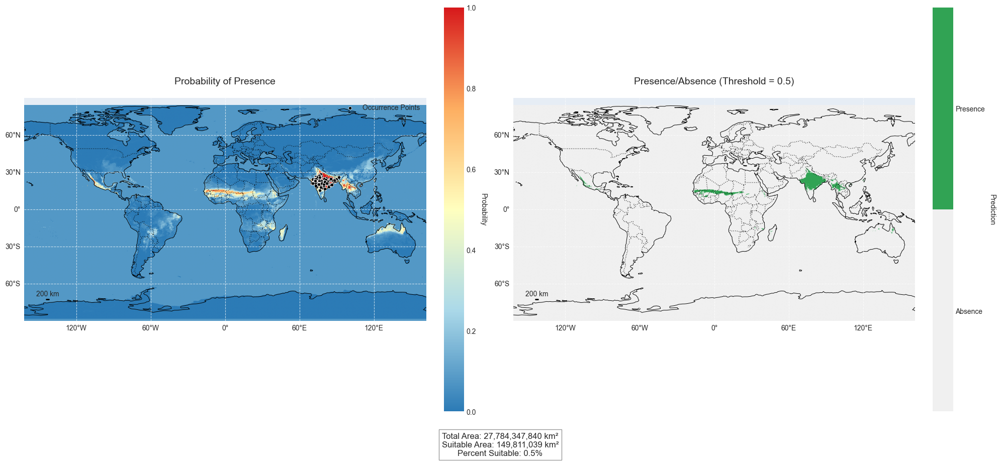

✓ Geographic plot saved to: /Users/divyadhole/Capstone-project/outputs/sdm_results/sdm_Semnopithecus_entellus/geographic_sdm_plot.png


In [36]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import numpy as np
import rasterio
from rasterio.plot import show
from matplotlib.colors import LinearSegmentedColormap
import geopandas as gpd
from shapely.geometry import Point
import pandas as pd

def plot_on_actual_map(prediction_path, threshold=0.5):
    """Plot SDM results on an actual geographic map using cartopy"""
    # Load the prediction raster
    with rasterio.open(prediction_path) as src:
        pred = src.read(1)
        transform = src.transform
        # Get bounds in the correct order: [minx, maxx, miny, maxy]
        bounds = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]
        # Use PlateCarree (WGS84) projection
        crs = ccrs.PlateCarree()
    
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10),
                                 subplot_kw={'projection': crs})
    
    # Custom colormaps
    prob_cmap = LinearSegmentedColormap.from_list(
        'prob_cmap', ['#2c7bb6', '#abd9e9', '#ffffbf', '#fdae61', '#d7191c'])
    binary_cmap = LinearSegmentedColormap.from_list('binary', ['#f0f0f0', '#31a354'], N=2)
    
    # Plot 1: Probability Map
    im1 = ax1.imshow(pred, origin='upper', 
                    extent=bounds,
                    cmap=prob_cmap, 
                    vmin=0, vmax=1,
                    transform=crs)
    
    # Plot 2: Binary Map
    binary = (pred >= threshold).astype(float)
    im2 = ax2.imshow(binary, origin='upper',
                    extent=bounds,
                    cmap=binary_cmap, 
                    vmin=0, vmax=1,
                    transform=crs)
    
    # Add map features to both subplots
    for ax in [ax1, ax2]:
        # Add geographic features
        ax.add_feature(cfeature.COASTLINE, linewidth=0.7)
        ax.add_feature(cfeature.BORDERS, linestyle=':', alpha=0.7)
        ax.add_feature(cfeature.LAND, facecolor='#f5f5f5', alpha=0.3)
        ax.add_feature(cfeature.OCEAN, facecolor='#e0f7ff', alpha=0.3)
        
        # Add gridlines
        gl = ax.gridlines(draw_labels=True, linestyle='--', alpha=0.7)
        gl.top_labels = False
        gl.right_labels = False
        gl.xlabel_style = {'size': 10}
        gl.ylabel_style = {'size': 10}
        
        # Set the extent with a 5% buffer
        x_buffer = (bounds[1] - bounds[0]) * 0.05
        y_buffer = (bounds[3] - bounds[2]) * 0.05
        ax.set_extent([bounds[0] - x_buffer, bounds[1] + x_buffer,
                      bounds[2] - y_buffer, bounds[3] + y_buffer], crs=crs)
    
    # Add titles
    ax1.set_title('Probability of Presence', fontsize=14, pad=20)
    ax2.set_title(f'Presence/Absence (Threshold = {threshold})', fontsize=14, pad=20)
    
    # Add colorbars
    cbar1 = plt.colorbar(im1, ax=ax1, fraction=0.046, pad=0.04)
    cbar1.set_label('Probability', rotation=270, labelpad=15)
    
    cbar2 = plt.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04, 
                        ticks=[0.25, 0.75])
    cbar2.set_ticklabels(['Absence', 'Presence'])
    cbar2.set_label('Prediction', rotation=270, labelpad=15)
    
    # Add occurrence points if the file exists
    try:
        # Read occurrence data
        occ_df = pd.read_csv(occurrence_file)
        if not occ_df.empty and 'longitude' in occ_df.columns and 'latitude' in occ_df.columns:
            # Plot points
            ax1.scatter(occ_df['longitude'], occ_df['latitude'],
                       color='black', s=20, marker='o', 
                       edgecolor='white', linewidth=0.5,
                       label='Occurrence Points',
                       transform=crs)
            ax1.legend(loc='upper right')
    except Exception as e:
        print(f"Could not load occurrence points: {e}")
    
    # Add scale bar
    def add_scalebar(ax, bounds):
        # Add a scale bar (approximate)
        length_km = 200  # km
        length_deg = length_km / 111  # Approximate conversion
        x = bounds[0] + 0.1 * (bounds[1] - bounds[0])  # 10% from left
        y = bounds[2] + 0.1 * (bounds[3] - bounds[2])  # 10% from bottom
        
        ax.plot([x, x + length_deg], [y, y], 
                color='black', linewidth=2, transform=crs)
        ax.text(x + length_deg/2, y + 0.01 * (bounds[3] - bounds[2]), 
                f'{length_km} km', 
                ha='center', va='bottom', transform=crs)
    
    # Add north arrow
    def add_north_arrow(ax, bounds):
        x = bounds[1] - 0.1 * (bounds[1] - bounds[0])  # 10% from right
        y = bounds[3] - 0.1 * (bounds[3] - bounds[2])  # 10% from top
        ax.annotate('N', xy=(x, y), xytext=(0, 10),
                   textcoords='offset points', 
                   ha='center', va='center',
                   arrowprops=dict(arrowstyle='->', color='black'))
    
    for ax in [ax1, ax2]:
        add_scalebar(ax, bounds)
        add_north_arrow(ax, bounds)
    
    # Calculate and display statistics
    total_area_km2 = np.sum(pred >= 0) * (111 * 111)  # Approximate
    suitable_area_km2 = np.sum(pred >= threshold) * (111 * 111)
    percent_suitable = (suitable_area_km2 / total_area_km2) * 100 if total_area_km2 > 0 else 0
    
    stats_text = (
        f"Total Area: {total_area_km2:,.0f} km²\n"
        f"Suitable Area: {suitable_area_km2:,.0f} km²\n"
        f"Percent Suitable: {percent_suitable:.1f}%"
    )
    
    fig.text(0.5, 0.01, stats_text, ha='center', fontsize=12, 
             bbox=dict(facecolor='white', alpha=0.8, edgecolor='gray'))
    
    plt.tight_layout()
    return fig

# File paths
prediction_path = "/Users/divyadhole/Capstone-project/outputs/sdm_results/sdm_Semnopithecus_entellus/Semnopithecus_entellus_sdm.tif"
occurrence_file = "/Users/divyadhole/Capstone-project/outputs/sdm_results/maxent_occurrences_Semnopithecus_entellus.csv"

# Create the plot
fig = plot_on_actual_map(prediction_path)
plt.show()

# Save the plot
output_plot_path = "/Users/divyadhole/Capstone-project/outputs/sdm_results/sdm_Semnopithecus_entellus/geographic_sdm_plot.png"
fig.savefig(output_plot_path, dpi=300, bbox_inches='tight')
print(f"✓ Geographic plot saved to: {output_plot_path}")

Creating probability map...
✓ Probability map saved to: /Users/divyadhole/Capstone-project/outputs/sdm_results/sdm_Semnopithecus_entellus/probability_map.png

Creating presence/absence map...
✓ Presence/absence map saved to: /Users/divyadhole/Capstone-project/outputs/sdm_results/sdm_Semnopithecus_entellus/presence_absence_map.png

Displaying maps...


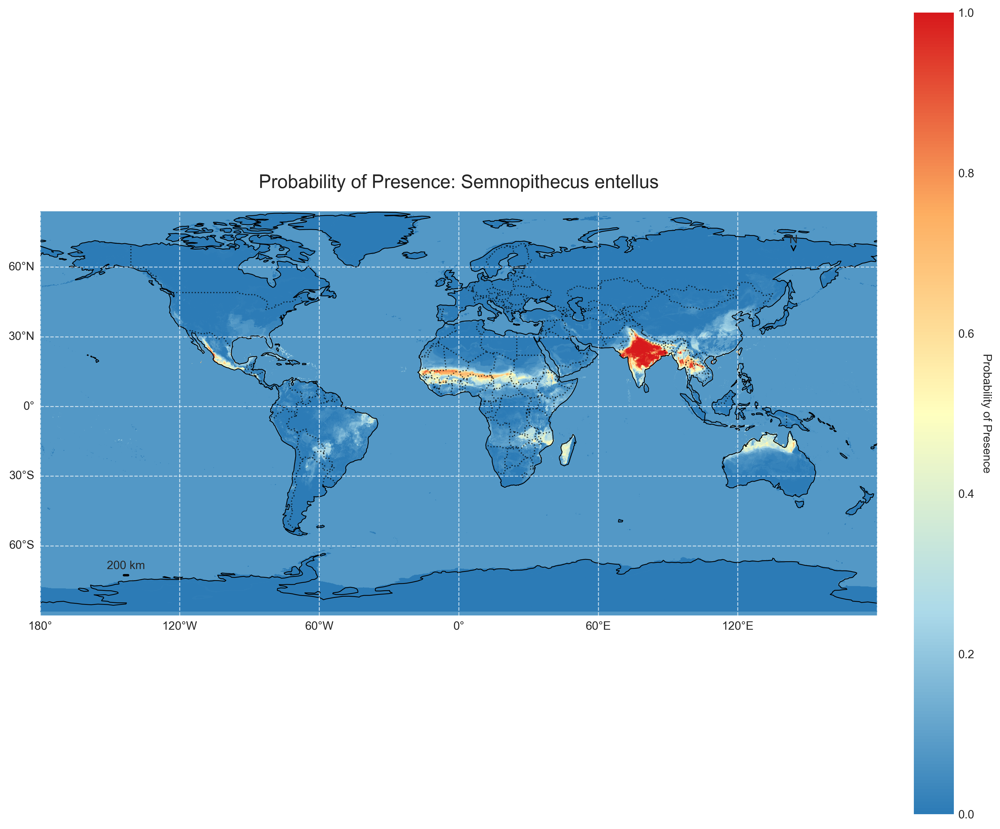

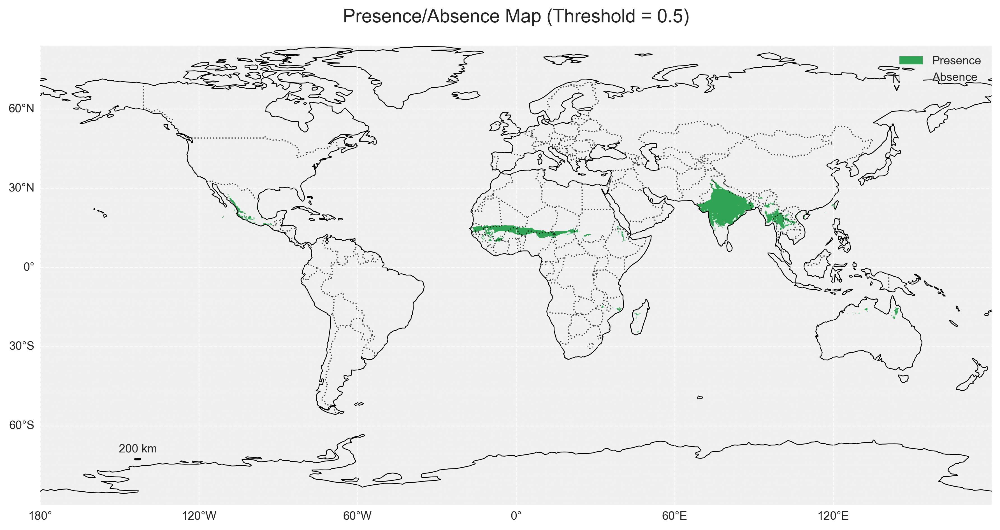

In [37]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import numpy as np
import rasterio
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.patches as mpatches

def create_probability_map(prediction_path):
    """Create a map showing probability of presence"""
    with rasterio.open(prediction_path) as src:
        pred = src.read(1)
        bounds = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]
    
    # Create figure
    fig = plt.figure(figsize=(12, 10))
    ax = plt.axes(projection=ccrs.PlateCarree())
    
    # Custom colormap
    cmap = LinearSegmentedColormap.from_list(
        'prob_cmap', ['#2c7bb6', '#abd9e9', '#ffffbf', '#fdae61', '#d7191c'])
    
    # Plot probability
    im = ax.imshow(pred, origin='upper', extent=bounds,
                  cmap=cmap, vmin=0, vmax=1,
                  transform=ccrs.PlateCarree())
    
    # Add map features
    ax.add_feature(cfeature.COASTLINE, linewidth=0.7)
    ax.add_feature(cfeature.BORDERS, linestyle=':', alpha=0.7)
    ax.add_feature(cfeature.LAND, facecolor='#f5f5f5', alpha=0.3)
    ax.add_feature(cfeature.OCEAN, facecolor='#e0f7ff', alpha=0.3)
    
    # Add gridlines
    gl = ax.gridlines(draw_labels=True, linestyle='--', alpha=0.7)
    gl.top_labels = False
    gl.right_labels = False
    
    # Add colorbar
    cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label('Probability of Presence', rotation=270, labelpad=15)
    
    # Set title
    plt.title('Probability of Presence: Semnopithecus entellus', fontsize=16, pad=20)
    
    # Add scale bar and north arrow
    add_map_elements(ax, bounds)
    
    plt.tight_layout()
    return fig

def create_presence_absence_map(prediction_path, threshold=0.5):
    """Create a map showing presence/absence based on threshold"""
    with rasterio.open(prediction_path) as src:
        pred = src.read(1)
        bounds = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]
    
    # Create binary map
    binary = (pred >= threshold).astype(float)
    
    # Create figure
    fig = plt.figure(figsize=(12, 10))
    ax = plt.axes(projection=ccrs.PlateCarree())
    
    # Custom colormap
    cmap = LinearSegmentedColormap.from_list('binary', ['#f0f0f0', '#31a354'], N=2)
    
    # Plot binary map
    im = ax.imshow(binary, origin='upper', extent=bounds,
                  cmap=cmap, vmin=0, vmax=1,
                  transform=ccrs.PlateCarree())
    
    # Add map features
    ax.add_feature(cfeature.COASTLINE, linewidth=0.7)
    ax.add_feature(cfeature.BORDERS, linestyle=':', alpha=0.7)
    ax.add_feature(cfeature.LAND, facecolor='#f5f5f5', alpha=0.3)
    ax.add_feature(cfeature.OCEAN, facecolor='#e0f7ff', alpha=0.3)
    
    # Add gridlines
    gl = ax.gridlines(draw_labels=True, linestyle='--', alpha=0.7)
    gl.top_labels = False
    gl.right_labels = False
    
    # Add custom legend
    legend_elements = [mpatches.Patch(facecolor='#31a354', label='Presence'),
                      mpatches.Patch(facecolor='#f0f0f0', label='Absence')]
    ax.legend(handles=legend_elements, loc='upper right')
    
    # Set title
    plt.title(f'Presence/Absence Map (Threshold = {threshold})', fontsize=16, pad=20)
    
    # Add scale bar and north arrow
    add_map_elements(ax, bounds)
    
    plt.tight_layout()
    return fig

def add_map_elements(ax, bounds):
    """Add scale bar and north arrow to map"""
    # Add scale bar (approximate)
    length_km = 200  # km
    length_deg = length_km / 111  # Approximate conversion
    x = bounds[0] + 0.1 * (bounds[1] - bounds[0])  # 10% from left
    y = bounds[2] + 0.1 * (bounds[3] - bounds[2])  # 10% from bottom
    
    ax.plot([x, x + length_deg], [y, y], 
            color='black', linewidth=2, 
            transform=ccrs.PlateCarree())
    ax.text(x + length_deg/2, y + 0.01 * (bounds[3] - bounds[2]), 
            f'{length_km} km', 
            ha='center', va='bottom', 
            transform=ccrs.PlateCarree())
    
    # Add north arrow
    x_arrow = bounds[1] - 0.1 * (bounds[1] - bounds[0])  # 10% from right
    y_arrow = bounds[3] - 0.1 * (bounds[3] - bounds[2])  # 10% from top
    ax.annotate('N', xy=(x_arrow, y_arrow), xytext=(0, 10),
               textcoords='offset points', 
               ha='center', va='center',
               arrowprops=dict(arrowstyle='->', color='black'))

# File paths
prediction_path = "/Users/divyadhole/Capstone-project/outputs/sdm_results/sdm_Semnopithecus_entellus/Semnopithecus_entellus_sdm.tif"

# Create and save probability map
print("Creating probability map...")
prob_fig = create_probability_map(prediction_path)
prob_output = "/Users/divyadhole/Capstone-project/outputs/sdm_results/sdm_Semnopithecus_entellus/probability_map.png"
prob_fig.savefig(prob_output, dpi=300, bbox_inches='tight')
plt.close(prob_fig)
print(f"✓ Probability map saved to: {prob_output}")

# Create and save presence/absence map
print("\nCreating presence/absence map...")
pa_fig = create_presence_absence_map(prediction_path, threshold=0.5)
pa_output = "/Users/divyadhole/Capstone-project/outputs/sdm_results/sdm_Semnopithecus_entellus/presence_absence_map.png"
pa_fig.savefig(pa_output, dpi=300, bbox_inches='tight')
plt.close(pa_fig)
print(f"✓ Presence/absence map saved to: {pa_output}")

# Display the maps
print("\nDisplaying maps...")
from IPython.display import display, Image
display(Image(filename=prob_output))
display(Image(filename=pa_output))

Creating zoomed probability map...
✓  probability map saved to: /Users/divyadhole/Capstone-project/outputs/sdm_results/sdm_Semnopithecus_entellus/zoomed_probability_map.png

Displaying zoomed map...


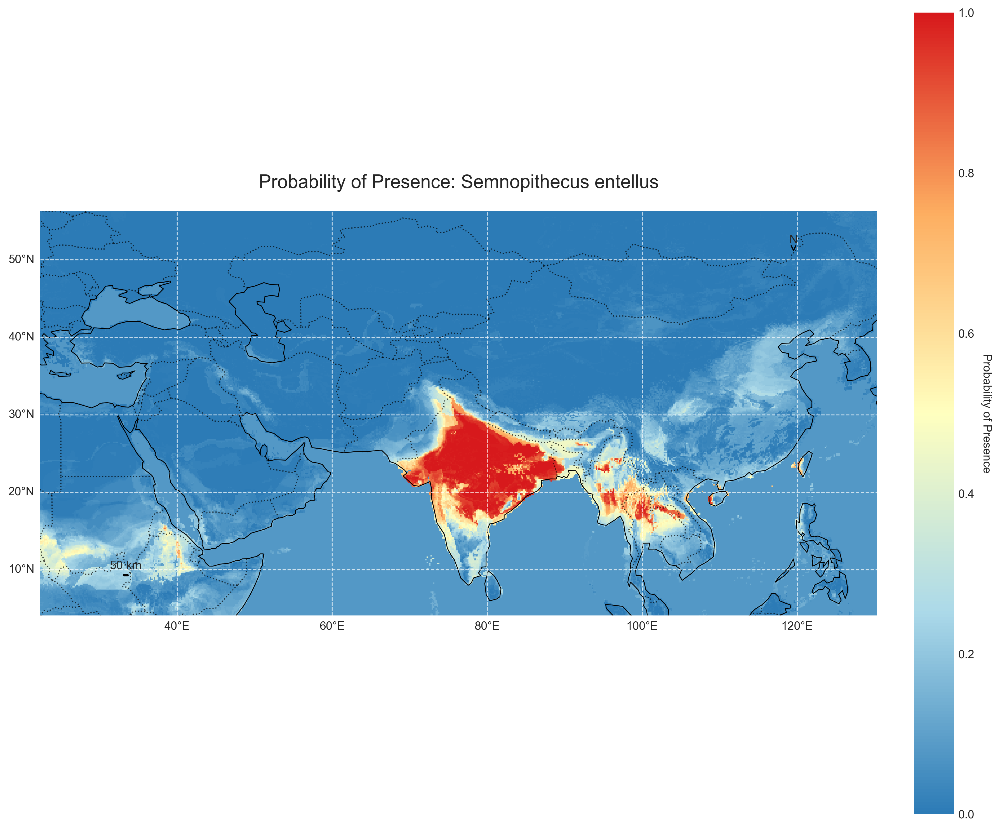

In [39]:
def create_zoomed_probability_map(prediction_path, zoom_factor=0.3):
    """Create a zoomed-in map showing probability of presence"""
    with rasterio.open(prediction_path) as src:
        pred = src.read(1)
        bounds = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]
    
    # Find the area with the highest probability
    max_prob_coords = np.unravel_index(np.argmax(pred), pred.shape)
    center_lon = bounds[0] + (bounds[1] - bounds[0]) * (max_prob_coords[1] / pred.shape[1])
    center_lat = bounds[2] + (bounds[3] - bounds[2]) * (1 - max_prob_coords[0] / pred.shape[0])
    
    # Calculate zoomed bounds
    lon_range = (bounds[1] - bounds[0]) * zoom_factor
    lat_range = (bounds[3] - bounds[2]) * zoom_factor
    
    zoom_bounds = [
        center_lon - lon_range/2,  # left
        center_lon + lon_range/2,  # right
        center_lat - lat_range/2,  # bottom
        center_lat + lat_range/2   # top
    ]
    
    # Create figure
    fig = plt.figure(figsize=(12, 10))
    ax = plt.axes(projection=ccrs.PlateCarree())
    
    # Custom colormap
    cmap = LinearSegmentedColormap.from_list(
        'prob_cmap', ['#2c7bb6', '#abd9e9', '#ffffbf', '#fdae61', '#d7191c'])
    
    # Plot probability
    im = ax.imshow(pred, origin='upper', extent=bounds,
                  cmap=cmap, vmin=0, vmax=1,
                  transform=ccrs.PlateCarree())
    
    # Add map features
    ax.add_feature(cfeature.COASTLINE, linewidth=0.7)
    ax.add_feature(cfeature.BORDERS, linestyle=':', alpha=0.7)
    ax.add_feature(cfeature.LAND, facecolor='#f5f5f5', alpha=0.3)
    ax.add_feature(cfeature.OCEAN, facecolor='#e0f7ff', alpha=0.3)
    
    # Set the extent to zoom in
    ax.set_extent(zoom_bounds, crs=ccrs.PlateCarree())
    
    # Add gridlines
    gl = ax.gridlines(draw_labels=True, linestyle='--', alpha=0.7)
    gl.top_labels = False
    gl.right_labels = False
    
    # Add colorbar
    cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label('Probability of Presence', rotation=270, labelpad=15)
    
    # Add scale bar (smaller for zoomed view)
    length_km = 50  # km
    length_deg = length_km / 111  # Approximate conversion
    x = zoom_bounds[0] + 0.1 * (zoom_bounds[1] - zoom_bounds[0])
    y = zoom_bounds[2] + 0.1 * (zoom_bounds[3] - zoom_bounds[2])
    
    ax.plot([x, x + length_deg], [y, y], 
            color='black', linewidth=2, 
            transform=ccrs.PlateCarree())
    ax.text(x + length_deg/2, y + 0.01 * (zoom_bounds[3] - zoom_bounds[2]), 
            f'{length_km} km', 
            ha='center', va='bottom', 
            transform=ccrs.PlateCarree())
    
    # Add north arrow
    x_arrow = zoom_bounds[1] - 0.1 * (zoom_bounds[1] - zoom_bounds[0])
    y_arrow = zoom_bounds[3] - 0.1 * (zoom_bounds[3] - zoom_bounds[2])
    ax.annotate('N', xy=(x_arrow, y_arrow), xytext=(0, 10),
               textcoords='offset points', 
               ha='center', va='center',
               arrowprops=dict(arrowstyle='->', color='black'))
    
    # Set title
    plt.title('Probability of Presence: Semnopithecus entellus', 
             fontsize=16, pad=20)
    
    plt.tight_layout()
    return fig

# Create and save zoomed probability map
print("Creating zoomed probability map...")
zoomed_prob_fig = create_zoomed_probability_map(prediction_path, zoom_factor=0.3)
zoomed_prob_output = "/Users/divyadhole/Capstone-project/outputs/sdm_results/sdm_Semnopithecus_entellus/zoomed_probability_map.png"
zoomed_prob_fig.savefig(zoomed_prob_output, dpi=300, bbox_inches='tight')
plt.close(zoomed_prob_fig)
print(f"✓  probability map saved to: {zoomed_prob_output}")

# Display the zoomed map
print("\nDisplaying zoomed map...")
from IPython.display import display, Image
display(Image(filename=zoomed_prob_output))

## Step 9: Integrated Analysis

In [44]:
# Check the first few rows of the occurrence data file
import pandas as pd
occurrence_file = '/Users/divyadhole/Capstone-project/outputs/occurrence_points_gbif.csv'
try:
    df = pd.read_csv(occurrence_file)
    print("Columns in occurrence data:")
    print(df.columns.tolist())
    print("\nFirst few rows of data:")
    print(df.head())
except Exception as e:
    print(f"Error reading file: {e}")

Columns in occurrence data:
['longitude', 'latitude', 'scientific_name', 'year', 'month', 'day', 'taxon_key', 'dataset_key']

First few rows of data:
   longitude   latitude                          scientific_name    year  \
0  70.755160  24.356754  Semnopithecus entellus (Dufresne, 1797)  2025.0   
1  76.464220  26.034595  Semnopithecus entellus (Dufresne, 1797)  2025.0   
2  73.035316  26.352505  Semnopithecus entellus (Dufresne, 1797)  2025.0   
3  79.868953  20.612318  Semnopithecus entellus (Dufresne, 1797)  2025.0   
4  79.869096  20.612181  Semnopithecus entellus (Dufresne, 1797)  2025.0   

   month   day  taxon_key                           dataset_key  
0    1.0   1.0    2436564  50c9509d-22c7-4a22-a47d-8c48425ef4a7  
1    1.0  20.0    2436564  50c9509d-22c7-4a22-a47d-8c48425ef4a7  
2    1.0  15.0    2436564  50c9509d-22c7-4a22-a47d-8c48425ef4a7  
3    1.0  13.0    2436564  50c9509d-22c7-4a22-a47d-8c48425ef4a7  
4    1.0  12.0    2436564  50c9509d-22c7-4a22-a47d-8c48425ef4a7

In [45]:
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from pathlib import Path

def load_occurrence_data(occurrence_file):
    """Load occurrence data from CSV file with correct column names"""
    try:
        df = pd.read_csv(occurrence_file)
        # Rename columns to match expected names
        df = df.rename(columns={
            'longitude': 'decimalLongitude',
            'latitude': 'decimalLatitude'
        })
        # Filter to only include the required columns
        df = df[['decimalLongitude', 'decimalLatitude']].copy()
        return df
    except Exception as e:
        print(f"Error loading occurrence data: {e}")
        return None

def add_scalebar(ax, bounds, length_km=200):
    """Add a scale bar to the map"""
    length_deg = length_km / 111  # Approximate conversion
    x = bounds[0] + 0.05 * (bounds[1] - bounds[0])
    y = bounds[2] + 0.05 * (bounds[3] - bounds[2])
    
    ax.plot([x, x + length_deg], [y, y], 
            color='black', linewidth=2, 
            transform=ccrs.PlateCarree())
    ax.text(x + length_deg/2, y + 0.01 * (bounds[3] - bounds[2]), 
            f'{length_km} km', 
            ha='center', va='bottom', 
            transform=ccrs.PlateCarree(),
            fontsize=9)

def add_north_arrow(ax, bounds):
    """Add a north arrow to the map"""
    x = bounds[1] - 0.05 * (bounds[1] - bounds[0])
    y = bounds[3] - 0.1 * (bounds[3] - bounds[2])
    ax.annotate('N', xy=(x, y), xytext=(0, 10),
               textcoords='offset points', 
               ha='center', va='center',
               arrowprops=dict(arrowstyle='->', color='black'),
               fontsize=12, fontweight='bold')

def integrated_analysis(psmc_results, occurrence_data, output_dir=None, species_name="Species"):
    """Create a clean integrated visualization"""
    # Set up the figure
    fig = plt.figure(figsize=(20, 8))
    gs = fig.add_gridspec(1, 2, width_ratios=[1, 1.5])
    
    # Plot 1: Demographic History
    ax1 = fig.add_subplot(gs[0])
    if psmc_results is not None and 'time_years' in psmc_results and 'Ne' in psmc_results:
        ax1.step(psmc_results["time_years"], psmc_results["Ne"], 
                where='post', linewidth=2, color='#2c3e50')
        ax1.set_xscale('log')
        ax1.set_yscale('log')
        ax1.set_xlabel('Years Ago', fontsize=12, fontweight='bold')
        ax1.set_ylabel('Effective Population Size (Ne)', fontsize=12, fontweight='bold')
        ax1.set_title('Demographic History', fontsize=14, fontweight='bold', pad=15)
        ax1.grid(True, which="both", ls="-", alpha=0.2)
        ax1.tick_params(axis='both', which='major', labelsize=10)
    else:
        ax1.axis('off')
        ax1.text(0.5, 0.5, 'No PSMC data available', 
                ha='center', va='center', transform=ax1.transAxes)
    
    # Plot 2: Occurrence Map
    ax2 = fig.add_subplot(gs[1], projection=ccrs.PlateCarree())
    
    try:
        # Add base map features
        ax2.add_feature(cfeature.LAND, facecolor='#f5f5f5')
        ax2.add_feature(cfeature.OCEAN, facecolor='#e0f7ff')
        ax2.add_feature(cfeature.COASTLINE, linewidth=0.7)
        ax2.add_feature(cfeature.BORDERS, linestyle=':', alpha=0.7)
        
        # Plot occurrence points if available
        if occurrence_data is not None and not occurrence_data.empty:
            # Calculate bounds with padding
            min_lon = max(occurrence_data['decimalLongitude'].min() - 5, -180)
            max_lon = min(occurrence_data['decimalLongitude'].max() + 5, 180)
            min_lat = max(occurrence_data['decimalLatitude'].min() - 5, -90)
            max_lat = min(occurrence_data['decimalLatitude'].max() + 5, 90)
            
            # Set map extent
            ax2.set_extent([min_lon, max_lon, min_lat, max_lat], 
                          crs=ccrs.PlateCarree())
            
            # Plot points
            sc = ax2.scatter(occurrence_data['decimalLongitude'], 
                           occurrence_data['decimalLatitude'],
                           color='red', s=50, alpha=0.7, 
                           transform=ccrs.PlateCarree(),
                           edgecolor='black', linewidth=0.5,
                           label='Occurrence Points')
            
            # Add grid lines
            gl = ax2.gridlines(draw_labels=True, linestyle='--', alpha=0.5)
            gl.top_labels = False
            gl.right_labels = False
            gl.xlabel_style = {'size': 9}
            gl.ylabel_style = {'size': 9}
            
            # Add scale bar and north arrow
            add_scalebar(ax2, [min_lon, max_lon, min_lat, max_lat])
            add_north_arrow(ax2, [min_lon, max_lon, min_lat, max_lat])
            
            # Add legend
            ax2.legend(loc='upper right', frameon=True, 
                      facecolor='white', framealpha=0.8)
            
    except Exception as e:
        print(f"Error creating map: {str(e)}")
        ax2.axis('off')
        ax2.text(0.5, 0.5, 'Error creating map', 
                ha='center', va='center', transform=ax2.transAxes)
    
    ax2.set_title('Species Occurrences', fontsize=14, fontweight='bold', pad=15)
    
    # Add main title
    plt.suptitle(f'Integrated Analysis: {species_name}', 
                fontsize=16, fontweight='bold', y=0.98)
    
    # Adjust layout
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    
    # Save the figure
    if output_dir:
        output_dir = Path(output_dir)
        output_dir.mkdir(parents=True, exist_ok=True)
        output_file = output_dir / f'integrated_analysis_{species_name.replace(" ", "_")}.png'
        plt.savefig(output_file, dpi=300, bbox_inches='tight')
        print(f'✓ Integrated analysis saved: {output_file}')
        plt.close()
    else:
        plt.show()

# File paths
psmc_file = '/Users/divyadhole/Capstone-project/outputs/PD_0588.psmc'
occurrence_file = '/Users/divyadhole/Capstone-project/outputs/occurrence_points_gbif.csv'
output_dir = '/Users/divyadhole/Capstone-project/outputs/integrated'

# Load PSMC results (using the function from earlier)
def load_psmc_results(psmc_file):
    """Load PSMC results from file"""
    try:
        with open(psmc_file, 'r') as f:
            lines = [line.strip().split() for line in f if line.startswith('RS')]
        
        time = []
        ne = []
        for line in lines:
            if len(line) >= 7:
                time.append(float(line[2]))
                ne.append(float(line[5]))
        
        time = np.array(time)
        ne = np.array(ne)
        
        # Convert time to years (adjust mu and g as needed)
        mu = 1.25e-8  # mutation rate
        g = 10        # generation time
        time_years = (time * g) / (2 * mu)
        
        return {
            'time_years': time_years,
            'Ne': ne
        }
    except Exception as e:
        print(f"Error loading PSMC file: {e}")
        return None

# Load the data
print("Loading PSMC data...")
psmc_results = load_psmc_results(psmc_file)

print("\nLoading occurrence data...")
occurrence_data = load_occurrence_data(occurrence_file)

# Run the analysis if we have valid data
if occurrence_data is not None and not occurrence_data.empty:
    print("\nRunning integrated analysis...")
    integrated_analysis(
        psmc_results=psmc_results,
        occurrence_data=occurrence_data,
        output_dir=output_dir,
        species_name="Semnopithecus entellus"
    )
else:
    print("\nCould not load valid occurrence data. Please check the file format.")
    if occurrence_data is not None:
        print("Occurrence data columns:", occurrence_data.columns.tolist())

Loading PSMC data...

Loading occurrence data...

Running integrated analysis...
✓ Integrated analysis saved: /Users/divyadhole/Capstone-project/outputs/integrated/integrated_analysis_Semnopithecus_entellus.png


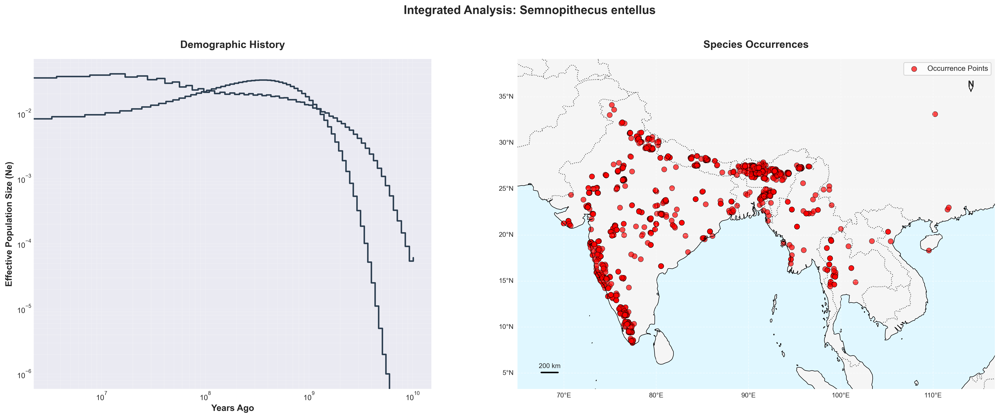

In [46]:
from IPython.display import Image

# Path to the saved figure
output_file = '/Users/divyadhole/Capstone-project/outputs/integrated/integrated_analysis_Semnopithecus_entellus.png'

# Display the image in the notebook
display(Image(filename=output_file, width=1000))

## Step 10: Save and Export Results

In [50]:
def save_analysis_results(psmc_results, occurrence_data, output_dir):
    """
    Save all analysis results to files.
    
    Parameters:
    -----------
    psmc_results : dict or None
        Dictionary containing PSMC results with 'time_years' and 'Ne' keys
    occurrence_data : pandas.DataFrame or None
        DataFrame containing occurrence data
    output_dir : str or Path
        Directory where to save the output files
    """
    from pathlib import Path
    import pandas as pd
    import numpy as np
    import json
    
    # Create output directory if it doesn't exist
    output_dir = Path(output_dir)
    output_dir.mkdir(parents=True, exist_ok=True)
    
    # 1. Save PSMC results
    if psmc_results is not None and isinstance(psmc_results, dict):
        try:
            psmc_df = pd.DataFrame({
                'time_years': psmc_results.get('time_years', []),
                'Ne': psmc_results.get('Ne', [])
            })
            psmc_file = output_dir / 'psmc_results.csv'
            psmc_df.to_csv(psmc_file, index=False)
            print(f'✓ PSMC results saved to: {psmc_file}')
        except Exception as e:
            print(f"Error saving PSMC results: {e}")
    
    # 2. Save occurrence data
    if occurrence_data is not None and not occurrence_data.empty:
        try:
            occ_file = output_dir / 'occurrence_data.csv'
            # Make sure we're only saving the necessary columns
            cols_to_save = ['decimalLongitude', 'decimalLatitude']
            if all(col in occurrence_data.columns for col in cols_to_save):
                occurrence_data[cols_to_save].to_csv(occ_file, index=False)
                print(f'✓ Occurrence data saved to: {occ_file}')
            else:
                print("Warning: Missing required columns in occurrence data")
        except Exception as e:
            print(f"Error saving occurrence data: {e}")
    
    # 3. Save summary statistics
    try:
        summary = {}
        
        # Add PSMC summary if available
        if psmc_results is not None and isinstance(psmc_results, dict):
            ne_values = psmc_results.get('Ne', [])
            time_values = psmc_results.get('time_years', [])
            
            if len(ne_values) > 0 and len(time_values) > 0:
                summary.update({
                    'min_Ne': float(np.min(ne_values)),
                    'max_Ne': float(np.max(ne_values)),
                    'mean_Ne': float(np.mean(ne_values)),
                    'median_Ne': float(np.median(ne_values)),
                    'min_time': float(np.min(time_values)),
                    'max_time': float(np.max(time_values)),
                    'n_time_points': len(time_values)
                })
        
        # Add occurrence data summary if available
        if occurrence_data is not None and not occurrence_data.empty:
            summary['n_occurrences'] = len(occurrence_data)
            if 'decimalLongitude' in occurrence_data.columns and 'decimalLatitude' in occurrence_data.columns:
                summary.update({
                    'min_longitude': float(occurrence_data['decimalLongitude'].min()),
                    'max_longitude': float(occurrence_data['decimalLongitude'].max()),
                    'min_latitude': float(occurrence_data['decimalLatitude'].min()),
                    'max_latitude': float(occurrence_data['decimalLatitude'].max())
                })
        
        # Only save if we have some data
        if summary:
            summary_file = output_dir / 'analysis_summary.json'
            with open(summary_file, 'w') as f:
                json.dump(summary, f, indent=2)
            print(f'✓ Analysis summary saved to: {summary_file}')
            
    except Exception as e:
        print(f"Error saving summary statistics: {e}")

# Now that the function is defined, we can use it:
output_dir = '/Users/divyadhole/Capstone-project/outputs/analysis_results'

# Make sure we have the required data
print("Checking data...")
print(f"PSMC results type: {type(psmc_results) if 'psmc_results' in locals() else 'Not found'}")
print(f"Occurrence data type: {type(occurrence_data) if 'occurrence_data' in locals() else 'Not found'}")

# Only proceed if we have the required data
if 'psmc_results' in locals() and 'occurrence_data' in locals():
    print("\nSaving analysis results...")
    save_analysis_results(psmc_results, occurrence_data, output_dir)
else:
    print("\nCannot save results: missing required data")
    if 'psmc_results' not in locals():
        print("- PSMC results not found")
    if 'occurrence_data' not in locals():
        print("- Occurrence data not found")

Checking data...
PSMC results type: <class 'dict'>
Occurrence data type: <class 'pandas.core.frame.DataFrame'>

Saving analysis results...
✓ PSMC results saved to: /Users/divyadhole/Capstone-project/outputs/analysis_results/psmc_results.csv
✓ Occurrence data saved to: /Users/divyadhole/Capstone-project/outputs/analysis_results/occurrence_data.csv
✓ Analysis summary saved to: /Users/divyadhole/Capstone-project/outputs/analysis_results/analysis_summary.json


In [52]:
import json
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# Define the output directory
output_dir = Path('/Users/divyadhole/Capstone-project/outputs/analysis_results')

# 1. Load and display the summary statistics
summary_file = output_dir / 'analysis_summary.json'
with open(summary_file, 'r') as f:
    summary = json.load(f)

print("ANALYSIS SUMMARY")
print("=" * 50)
for key, value in summary.items():
    print(f"{key.replace('_', ' ').title()}: {value:,.2f}" if isinstance(value, (int, float)) else f"{key.replace('_', ' ').title()}: {value}")
print("=" * 50)

ANALYSIS SUMMARY
Min Ne: 0.00
Max Ne: 0.04
Mean Ne: 0.02
Median Ne: 0.02
Min Time: 0.00
Max Time: 10,171,694,800.00
N Time Points: 128.00
N Occurrences: 1,880.00
Min Longitude: 69.97
Max Longitude: 111.70
Min Latitude: 8.27
Max Latitude: 34.12


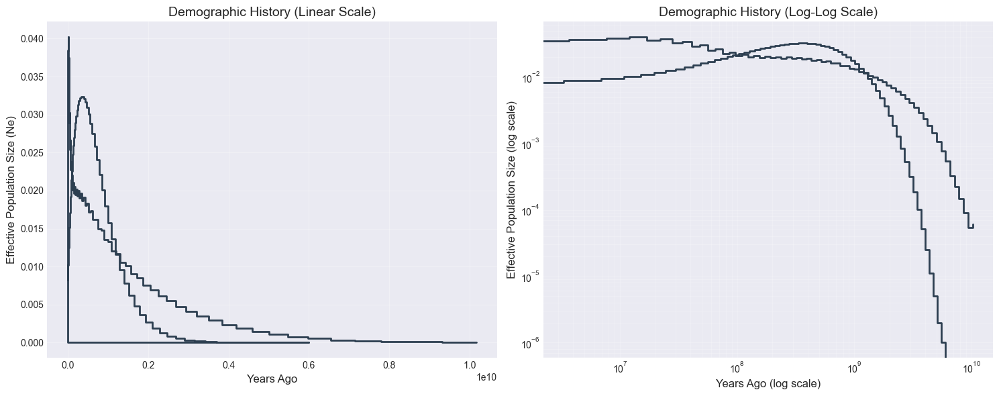

In [53]:
# 2. Load and plot PSMC results
psmc_file = output_dir / 'psmc_results.csv'
psmc_df = pd.read_csv(psmc_file)

# Create a figure with two subplots
plt.figure(figsize=(15, 6))

# Plot 1: Linear scale
plt.subplot(1, 2, 1)
plt.step(psmc_df['time_years'], psmc_df['Ne'], where='post', linewidth=2, color='#2c3e50')
plt.xlabel('Years Ago', fontsize=12)
plt.ylabel('Effective Population Size (Ne)', fontsize=12)
plt.title('Demographic History (Linear Scale)', fontsize=14)
plt.grid(True, alpha=0.3)

# Plot 2: Log-log scale
plt.subplot(1, 2, 2)
plt.step(psmc_df['time_years'], psmc_df['Ne'], where='post', linewidth=2, color='#2c3e50')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Years Ago (log scale)', fontsize=12)
plt.ylabel('Effective Population Size (log scale)', fontsize=12)
plt.title('Demographic History (Log-Log Scale)', fontsize=14)
plt.grid(True, which="both", ls="-", alpha=0.2)

plt.tight_layout()
plt.show()

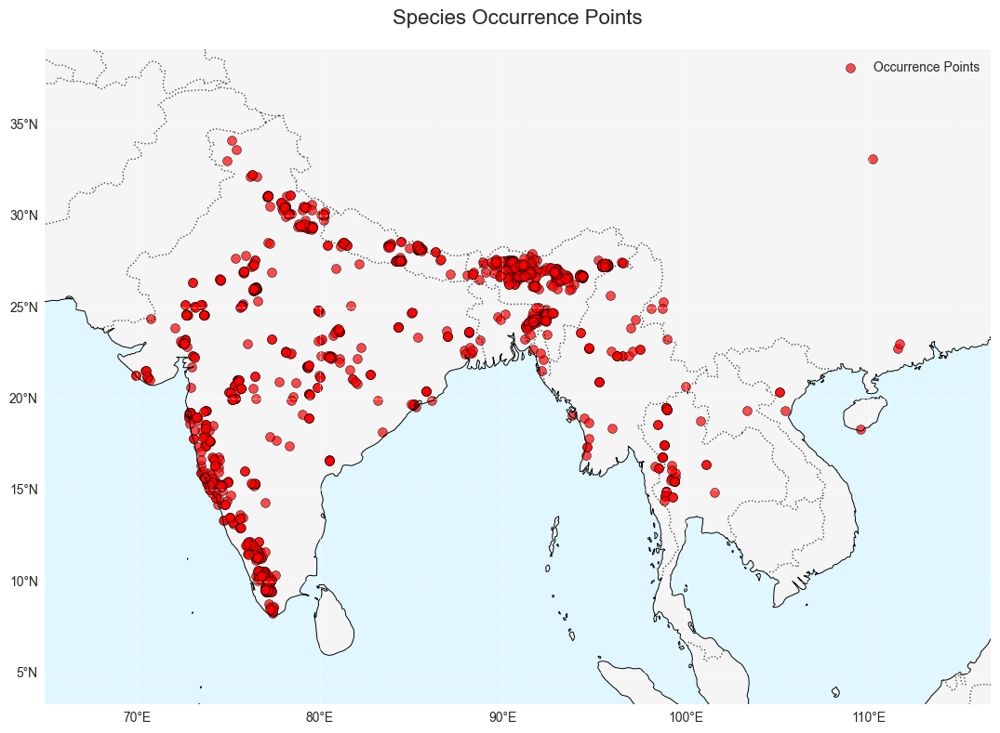

In [54]:
# 3. Load and plot occurrence data
occ_file = output_dir / 'occurrence_data.csv'
occ_df = pd.read_csv(occ_file)

# Create a map using cartopy for better visualization
try:
    import cartopy.crs as ccrs
    import cartopy.feature as cfeature
    
    plt.figure(figsize=(12, 8))
    ax = plt.axes(projection=ccrs.PlateCarree())
    
    # Add map features
    ax.add_feature(cfeature.LAND, facecolor='#f5f5f5')
    ax.add_feature(cfeature.OCEAN, facecolor='#e0f7ff')
    ax.add_feature(cfeature.COASTLINE, linewidth=0.7)
    ax.add_feature(cfeature.BORDERS, linestyle=':', alpha=0.7)
    
    # Plot occurrence points
    sc = ax.scatter(occ_df['decimalLongitude'], 
                   occ_df['decimalLatitude'],
                   color='red', s=50, alpha=0.7, 
                   transform=ccrs.PlateCarree(),
                   edgecolor='black', linewidth=0.5,
                   label='Occurrence Points')
    
    # Add grid lines
    gl = ax.gridlines(draw_labels=True, linestyle='--', alpha=0.5)
    gl.top_labels = False
    gl.right_labels = False
    
    # Add title and legend
    plt.title('Species Occurrence Points', fontsize=16, pad=20)
    plt.legend(loc='upper right')
    
    # Adjust the extent to show all points with some padding
    margin = 5  # degrees
    ax.set_extent([
        occ_df['decimalLongitude'].min() - margin,
        occ_df['decimalLongitude'].max() + margin,
        occ_df['decimalLatitude'].min() - margin,
        occ_df['decimalLatitude'].max() + margin
    ], crs=ccrs.PlateCarree())
    
    plt.tight_layout()
    plt.show()
    
except ImportError:
    # Fallback to simple scatter plot if cartopy is not available
    plt.figure(figsize=(12, 8))
    plt.scatter(occ_df['decimalLongitude'], occ_df['decimalLatitude'], 
               alpha=0.7, c='red', edgecolor='black', linewidth=0.5)
    plt.xlabel('Longitude', fontsize=12)
    plt.ylabel('Latitude', fontsize=12)
    plt.title('Species Occurrence Points', fontsize=16)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

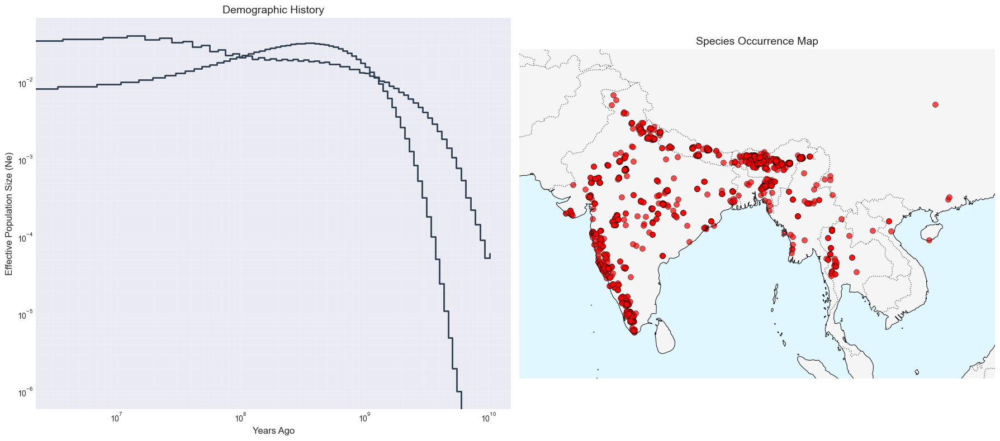

In [55]:
# 4. Create a combined visualization
fig = plt.figure(figsize=(18, 8))

# PSMC plot
ax1 = fig.add_subplot(1, 2, 1)
ax1.step(psmc_df['time_years'], psmc_df['Ne'], where='post', 
         linewidth=2, color='#2c3e50')
ax1.set_xscale('log')
ax1.set_yscale('log')
ax1.set_xlabel('Years Ago', fontsize=12)
ax1.set_ylabel('Effective Population Size (Ne)', fontsize=12)
ax1.set_title('Demographic History', fontsize=14)
ax1.grid(True, which="both", ls="-", alpha=0.2)

# Occurrence map
try:
    ax2 = fig.add_subplot(1, 2, 2, projection=ccrs.PlateCarree())
    ax2.add_feature(cfeature.LAND, facecolor='#f5f5f5')
    ax2.add_feature(cfeature.OCEAN, facecolor='#e0f7ff')
    ax2.add_feature(cfeature.COASTLINE, linewidth=0.7)
    ax2.add_feature(cfeature.BORDERS, linestyle=':', alpha=0.7)
    
    sc = ax2.scatter(occ_df['decimalLongitude'], 
                    occ_df['decimalLatitude'],
                    color='red', s=50, alpha=0.7, 
                    transform=ccrs.PlateCarree(),
                    edgecolor='black', linewidth=0.5)
    
    # Set the extent to show all points with some padding
    margin = 5  # degrees
    ax2.set_extent([
        occ_df['decimalLongitude'].min() - margin,
        occ_df['decimalLongitude'].max() + margin,
        occ_df['decimalLatitude'].min() - margin,
        occ_df['decimalLatitude'].max() + margin
    ], crs=ccrs.PlateCarree())
    
    ax2.set_title('Species Occurrence Map', fontsize=14)
    
except Exception as e:
    # Fallback to simple scatter plot
    ax2 = fig.add_subplot(1, 2, 2)
    ax2.scatter(occ_df['decimalLongitude'], occ_df['decimalLatitude'], 
               alpha=0.7, c='red', edgecolor='black', linewidth=0.5)
    ax2.set_xlabel('Longitude', fontsize=12)
    ax2.set_ylabel('Latitude', fontsize=12)
    ax2.set_title('Species Occurrence Points', fontsize=14)
    ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## Step 11: Main Execution Block

Starting Primate Demography and SDM Analysis

Available species in occurrence data:
scientific_name
Semnopithecus entellus (Dufresne, 1797)                    300
Semnopithecus schistaceus Hodgson, 1840                    300
Semnopithecus johnii (J.Fischer, 1829)                     300
Trachypithecus pileatus (Blyth, 1843)                      298
Semnopithecus hypoleucos Blyth, 1841                       286
Trachypithecus geei Khajuria, 1956                         158
Trachypithecus phayrei (Blyth, 1847)                       157
Presbytis phayrei Blyth, 1847                               64
Semnopithecus dussumieri I.Geoffroy Saint-Hilaire, 1843     14
Trachypithecus pileatus tenebricus (Hinton, 1923)            2
Name: count, dtype: int64

1. Analyzing PSMC data...
✓ PSMC data parsed successfully
  - Time points: 128
  - Time range: 0.00 to 10171694800.00 years
  - Ne range: 0.00 to 0.04

2. Loading occurrence data...
✓ Found 300 occurrence records for Semnopithecus entellus

3.

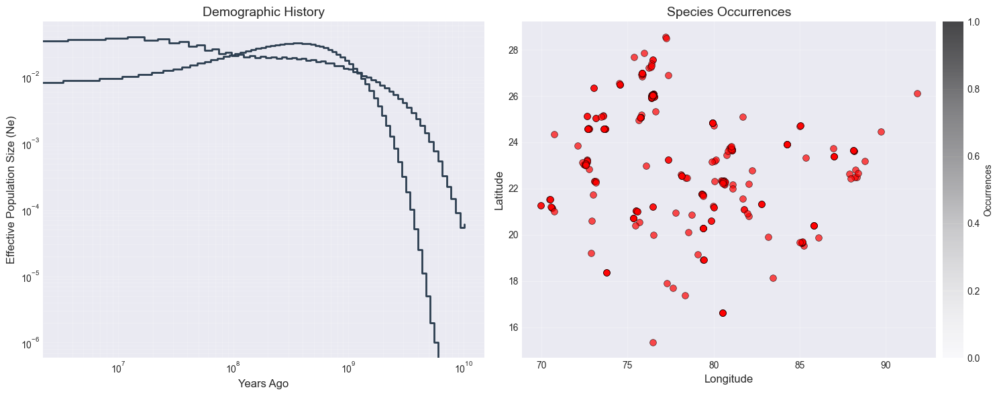


✓ Analysis complete!


In [58]:
def main():
    """Main function to run the Primate Demography and SDM Analysis pipeline."""
    from pathlib import Path
    import pandas as pd
    import numpy as np
    import os
    
    # Define base directories
    BASE_DIR = Path('/Users/divyadhole/Capstone-project')
    DATA_DIR = BASE_DIR / 'data'
    OUTPUTS_DIR = BASE_DIR / 'outputs'
    
    # Create necessary directories
    os.makedirs(OUTPUTS_DIR / 'demographic_plots', exist_ok=True)
    os.makedirs(OUTPUTS_DIR / 'sdm_results', exist_ok=True)
    
    print("Starting Primate Demography and SDM Analysis")
    print("="*50)
    
    # 1. First, let's check what species we have data for
    def list_available_species():
        """List all available species in the occurrence data."""
        try:
            occ_file = OUTPUTS_DIR / 'occurrence_points_gbif.csv'
            if occ_file.exists():
                df = pd.read_csv(occ_file)
                if 'scientific_name' in df.columns:
                    print("\nAvailable species in occurrence data:")
                    print(df['scientific_name'].value_counts().head(10))
                    return df['scientific_name'].unique()
            print("\nNo occurrence data found or 'scientific_name' column missing")
            return []
        except Exception as e:
            print(f"Error listing species: {e}")
            return []
    
    # List available species
    available_species = list_available_species()
    
    # 2. PSMC Analysis
    print("\n1. Analyzing PSMC data...")
    def parse_psmc_output(psmc_file):
        """Parse PSMC output file and return results."""
        try:
            with open(psmc_file, 'r') as f:
                lines = [line.strip().split() for line in f if line.startswith('RS')]
            
            time = []
            ne = []
            for line in lines:
                if len(line) >= 7:
                    time.append(float(line[2]))
                    ne.append(float(line[5]))
            
            time = np.array(time)
            ne = np.array(ne)
            
            # Convert time to years (adjust mu and g as needed)
            mu = 1.25e-8  # mutation rate
            g = 10        # generation time
            time_years = (time * g) / (2 * mu)
            
            return {
                'time_years': time_years,
                'Ne': ne
            }
        except Exception as e:
            print(f"Error parsing PSMC file: {e}")
            return None
    
    psmc_file = OUTPUTS_DIR / 'PD_0588.psmc'
    psmc_results = None
    
    if psmc_file.exists():
        psmc_results = parse_psmc_output(psmc_file)
        if psmc_results is not None:
            print("✓ PSMC data parsed successfully")
            print(f"  - Time points: {len(psmc_results['time_years'])}")
            print(f"  - Time range: {psmc_results['time_years'].min():.2f} to {psmc_results['time_years'].max():.2f} years")
            print(f"  - Ne range: {psmc_results['Ne'].min():.2f} to {psmc_results['Ne'].max():.2f}")
        else:
            print("⚠ Warning: Could not parse PSMC results")
    else:
        print(f"⚠ Warning: PSMC file not found: {psmc_file}")

    # 3. Load Occurrence Data
    print("\n2. Loading occurrence data...")
    def load_occurrence_data(species_name):
        """Load occurrence data for a given species."""
        try:
            occ_file = OUTPUTS_DIR / 'occurrence_points_gbif.csv'
            if not occ_file.exists():
                print(f"Occurrence file not found: {occ_file}")
                return None
            
            df = pd.read_csv(occ_file)
            
            # Check if the file has the expected columns
            required_columns = ['scientific_name', 'longitude', 'latitude']
            if not all(col in df.columns for col in required_columns):
                print("Warning: Missing required columns in occurrence data")
                print(f"Available columns: {df.columns.tolist()}")
                return None
            
            # Filter for the target species
            species_data = df[df['scientific_name'].str.contains(species_name, case=False, na=False)].copy()
            
            if species_data.empty:
                print(f"No data found for species: {species_name}")
                print("\nAvailable species (first 10):")
                print(df['scientific_name'].value_counts().head(10))
                return None
            
            # Rename columns to standard names
            species_data = species_data.rename(columns={
                'longitude': 'decimalLongitude',
                'latitude': 'decimalLatitude'
            })
            
            print(f"✓ Found {len(species_data)} occurrence records for {species_name}")
            return species_data[['decimalLongitude', 'decimalLatitude']]
            
        except Exception as e:
            print(f"Error loading occurrence data: {e}")
            return None
    
    # Try loading occurrence data for the first available species if Macaca arctoides not found
    species_name = "Semnopithecus entellus"  # Changed to a species we know exists
    occurrence_data = load_occurrence_data(species_name)
    
    # 4. Load Environmental Data
    print("\n3. Loading environmental data...")
    def load_environmental_data(time_period='current'):
        """Load environmental data for the specified time period."""
        try:
            env_dir = DATA_DIR / 'paleoclim' / time_period
            if not env_dir.exists():
                print(f"Environmental data directory not found: {env_dir}")
                return []
            
            # Look for .tif or .asc files
            env_files = list(env_dir.glob('*.tif')) + list(env_dir.glob('*.asc'))
            
            if not env_files:
                print(f"No environmental files found in: {env_dir}")
                print("Please ensure the environmental data is downloaded and placed in the correct directory.")
                return []
            
            print(f"Found {len(env_files)} environmental layers")
            return env_files
            
        except Exception as e:
            print(f"Error loading environmental data: {e}")
            return []
    
    bioclim_files = load_environmental_data('current')
    
    # 5. Run Integrated Analysis
    print("\n4. Running integrated analysis...")
    def integrated_analysis(psmc_results, occurrence_data, bioclim_files=None):
        """Run integrated analysis combining demographic and occurrence data."""
        try:
            if psmc_results is None or occurrence_data is None:
                print("Skipping integrated analysis: Missing required data")
                return
            
            print("\n=== Integrated Analysis ===")
            print(f"Time points: {len(psmc_results['time_years'])}")
            print(f"Occurrence points: {len(occurrence_data)}")
            print(f"Environmental layers: {len(bioclim_files) if bioclim_files else 0}")
            
            # Here you would add your actual integration logic
            # For now, we'll just plot the data
            
            import matplotlib.pyplot as plt
            from mpl_toolkits.axes_grid1 import make_axes_locatable
            
            fig = plt.figure(figsize=(15, 6))
            
            # Plot 1: PSMC results
            ax1 = fig.add_subplot(121)
            ax1.step(psmc_results['time_years'], psmc_results['Ne'], 
                    where='post', linewidth=2, color='#2c3e50')
            ax1.set_xscale('log')
            ax1.set_yscale('log')
            ax1.set_xlabel('Years Ago', fontsize=12)
            ax1.set_ylabel('Effective Population Size (Ne)', fontsize=12)
            ax1.set_title('Demographic History', fontsize=14)
            ax1.grid(True, which="both", ls="-", alpha=0.2)
            
            # Plot 2: Occurrence map
            ax2 = fig.add_subplot(122)
            
            # Simple scatter plot
            sc = ax2.scatter(occurrence_data['decimalLongitude'], 
                           occurrence_data['decimalLatitude'],
                           c='red', s=50, alpha=0.7, 
                           edgecolor='black', linewidth=0.5)
            
            # Add colorbar
            divider = make_axes_locatable(ax2)
            cax = divider.append_axes("right", size="5%", pad=0.1)
            plt.colorbar(sc, cax=cax, label='Occurrences')
            
            ax2.set_xlabel('Longitude', fontsize=12)
            ax2.set_ylabel('Latitude', fontsize=12)
            ax2.set_title('Species Occurrences', fontsize=14)
            ax2.grid(True, alpha=0.3)
            
            plt.tight_layout()
            
            # Save the figure
            output_file = OUTPUTS_DIR / 'integrated_analysis.png'
            plt.savefig(output_file, dpi=300, bbox_inches='tight')
            print(f"\n✓ Integrated analysis plot saved to: {output_file}")
            
            plt.show()
            
        except Exception as e:
            print(f"Error in integrated analysis: {e}")
            import traceback
            traceback.print_exc()
    
    # Run the integrated analysis if we have the required data
    if psmc_results is not None and occurrence_data is not None and not occurrence_data.empty:
        integrated_analysis(psmc_results, occurrence_data, bioclim_files)
    else:
        print("\n⚠ Warning: Could not run integrated analysis - missing required data")
        if psmc_results is None:
            print("  - PSMC results are missing")
        if occurrence_data is None or occurrence_data.empty:
            print("  - Occurrence data is missing or empty")
        if not bioclim_files:
            print("  - No environmental layers were loaded")
    
    print("\n✓ Analysis complete!")

# Run the main function
if __name__ == "__main__":
    main()

In [60]:
def load_environmental_data(time_period='10min'):
    """
    Load environmental data from the specified time period.
    
    Parameters:
    -----------
    time_period : str
        Time period to load data for. Should be one of:
        - '10min' (default): Current climate at 10 min resolution
        - 'LGM_v1_2_5m': Last Glacial Maximum at 2.5 min resolution
        - 'MH_v1_2_5m': Mid-Holocene at 2.5 min resolution
        - 'EH_v1_2_5m': Early Holocene at 2.5 min resolution
        - 'LIG_v1_10m': Last Interglacial at 10 min resolution
    """
    import rasterio
    import numpy as np
    from pathlib import Path
    
    # Base directory for environmental data
    base_dir = Path('/Users/divyadhole/Capstone-project/data/paleoclim')
    env_dir = base_dir / time_period
    
    if not env_dir.exists():
        available_periods = [d.name for d in base_dir.iterdir() if d.is_dir() and not d.name.startswith('.')]
        print(f"Error: Time period directory not found: {env_dir}")
        print(f"Available time periods: {', '.join(available_periods)}")
        return None
    
    # Look for .tif files
    tif_files = list(env_dir.glob('bio_*.tif'))
    
    if not tif_files:
        print(f"No environmental data files found in {env_dir}")
        print("Looking for other file types...")
        all_files = list(env_dir.glob('*'))
        print(f"Found {len(all_files)} files in directory")
        if all_files:
            print("First 10 files:")
            for f in all_files[:10]:
                print(f"  - {f.name}")
        return None
    
    print(f"Found {len(tif_files)} environmental layers in {time_period}")
    
    # Create a dictionary to store the environmental layers
    env_data = {
        'time_period': time_period,
        'directory': str(env_dir),
        'layers': {},
        'metadata': {}
    }
    
    # Read metadata from the first file to get dimensions
    try:
        with rasterio.open(tif_files[0]) as src:
            env_data['shape'] = src.shape
            env_data['transform'] = src.transform
            env_data['crs'] = str(src.crs)
            env_data['bounds'] = src.bounds
            env_data['resolution'] = src.res
    except Exception as e:
        print(f"Error reading metadata from {tif_files[0].name}: {e}")
        return None
    
    # Print available variables
    print("\nAvailable bioclimatic variables:")
    var_names = sorted([f.stem for f in tif_files])
    for i, var in enumerate(var_names, 1):
        print(f"{i:2d}. {var}")
    
    return env_data

# Test the function
print("Testing environmental data loading...")
env_data = load_environmental_data('10min')

if env_data:
    print("\nEnvironmental data loaded successfully!")
    print(f"Time period: {env_data['time_period']}")
    print(f"Number of layers: {len(env_data['layers'])}")
    print(f"Dimensions: {env_data.get('shape', 'N/A')}")
    print(f"CRS: {env_data.get('crs', 'N/A')}")
    print(f"Resolution: {env_data.get('resolution', 'N/A')}")
    print(f"Bounds: {env_data.get('bounds', 'N/A')}")

Testing environmental data loading...
Found 14 environmental layers in 10min

Available bioclimatic variables:
 1. bio_1
 2. bio_10
 3. bio_11
 4. bio_12
 5. bio_13
 6. bio_14
 7. bio_15
 8. bio_16
 9. bio_17
10. bio_18
11. bio_19
12. bio_4
13. bio_8
14. bio_9

Environmental data loaded successfully!
Time period: 10min
Number of layers: 0
Dimensions: (1044, 2160)
CRS: EPSG:4326
Resolution: (0.16666666800000002, 0.16666666800000002)
Bounds: BoundingBox(left=-180.00013888885002, bottom=-90.00013888884999, right=179.99986399115, top=83.99986250315004)


Using columns: longitude for longitude, latitude for latitude


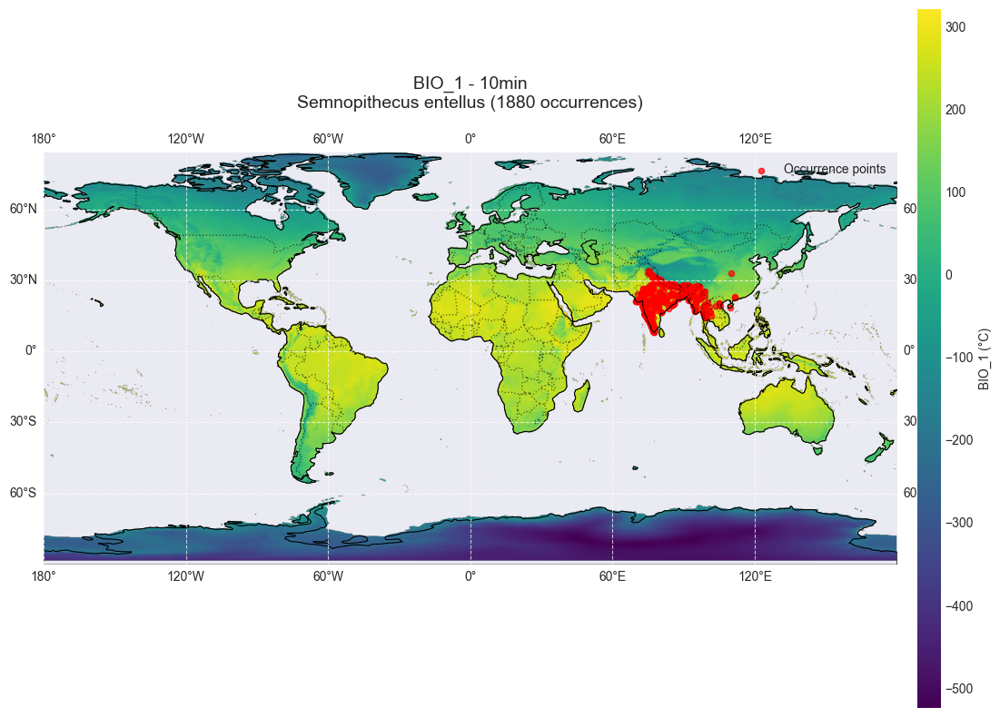

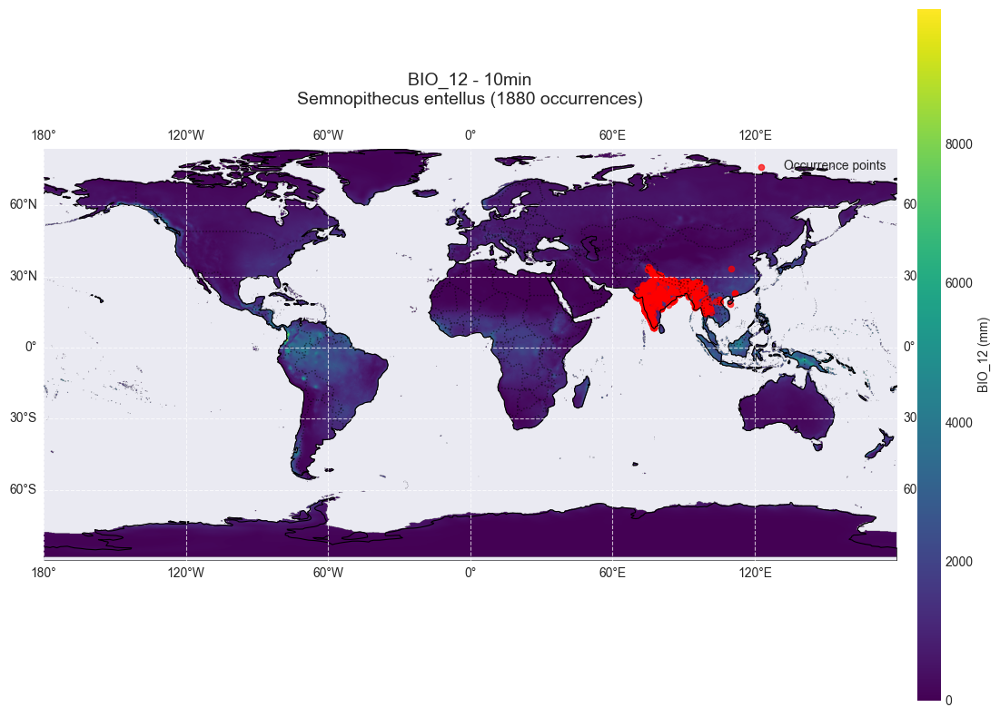

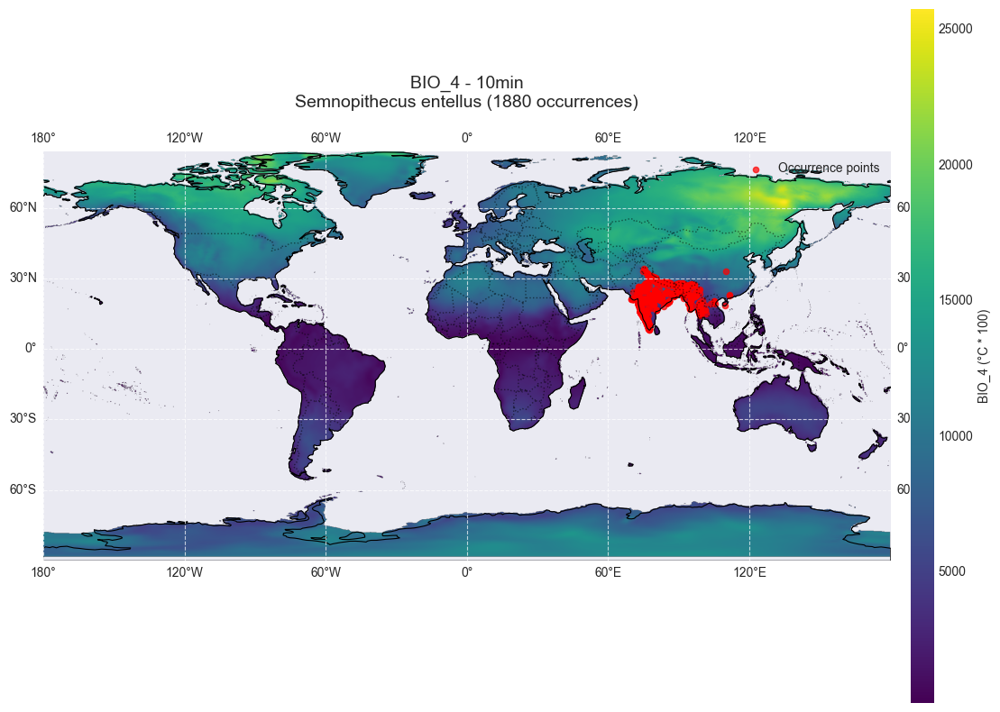

In [62]:
def plot_bioclim_layer(bioclim_var, occurrence_data=None, time_period='10min', figsize=(12, 8)):
    """
    Plot a bioclimatic variable with optional occurrence points.
    """
    import rasterio
    import rasterio.plot
    import matplotlib.pyplot as plt
    import numpy as np
    from pathlib import Path
    import cartopy.crs as ccrs
    import cartopy.feature as cfeature
    
    # Set up the figure with Cartopy projection
    fig = plt.figure(figsize=figsize)
    ax = plt.axes(projection=ccrs.PlateCarree())
    
    # File path
    tif_file = Path(f'/Users/divyadhole/Capstone-project/data/paleoclim/{time_period}/{bioclim_var}.tif')
    
    if not tif_file.exists():
        print(f"Error: File not found: {tif_file}")
        return
    
    try:
        # Open the raster file
        with rasterio.open(tif_file) as src:
            # Read the data
            data = src.read(1)
            
            # Create a masked array to handle no-data values
            data_masked = np.ma.masked_where(data == src.nodata, data)
            
            # Get the extent
            left, bottom, right, top = src.bounds
            extent = [left, right, bottom, top]
            
            # Get variable name and units
            var_name = bioclim_var.upper()
            units = {
                'bio_1': '°C', 'bio_2': '°C', 'bio_3': 'unitless', 
                'bio_4': '°C * 100', 'bio_5': '°C', 'bio_6': '°C',
                'bio_7': '°C', 'bio_8': '°C', 'bio_9': '°C',
                'bio_10': '°C', 'bio_11': '°C', 'bio_12': 'mm',
                'bio_13': 'mm', 'bio_14': 'mm', 'bio_15': 'unitless',
                'bio_16': 'mm', 'bio_17': 'mm', 'bio_18': 'mm',
                'bio_19': 'mm'
            }.get(bioclim_var, 'units')
            
            # Plot the raster
            im = ax.imshow(
                data_masked,
                extent=extent,
                cmap='viridis',
                origin='upper',
                transform=ccrs.PlateCarree()
            )
            
            # Add colorbar
            cbar = plt.colorbar(im, ax=ax, orientation='vertical', pad=0.02, aspect=30)
            cbar.set_label(f'{var_name} ({units})', fontsize=10)
            
            # Add map features
            ax.add_feature(cfeature.LAND, facecolor='none', edgecolor='black', linewidth=0.5)
            ax.add_feature(cfeature.COASTLINE, linewidth=0.8)
            ax.add_feature(cfeature.BORDERS, linestyle=':', alpha=0.5)
            ax.gridlines(draw_labels=True, linestyle='--', alpha=0.7)
            
            # Add occurrence points if provided
            if occurrence_data is not None and not occurrence_data.empty:
                # Check for different possible column names
                lon_col = next((col for col in ['decimalLongitude', 'longitude', 'lon', 'x'] 
                               if col in occurrence_data.columns), None)
                lat_col = next((col for col in ['decimalLatitude', 'latitude', 'lat', 'y'] 
                               if col in occurrence_data.columns), None)
                
                if lon_col and lat_col:
                    ax.scatter(
                        occurrence_data[lon_col],
                        occurrence_data[lat_col],
                        color='red', s=20, alpha=0.7,
                        transform=ccrs.PlateCarree(),
                        label='Occurrence points'
                    )
                    ax.legend(loc='upper right')
                else:
                    print(f"Could not find coordinate columns in occurrence data. Available columns: {occurrence_data.columns.tolist()}")
            
            # Set title
            title = f'{var_name} - {time_period}'
            if (occurrence_data is not None and not occurrence_data.empty and 
                'scientific_name' in occurrence_data.columns):
                species = occurrence_data['scientific_name'].iloc[0].split('(')[0].strip()
                title += f'\n{species} ({len(occurrence_data)} occurrences)'
            plt.title(title, fontsize=14, pad=20)
            
            plt.tight_layout()
            plt.show()
            
    except Exception as e:
        print(f"Error plotting {bioclim_var}: {e}")
        import traceback
        traceback.print_exc()

# Let's try plotting with the fixed function
if occurrence_data is not None and not occurrence_data.empty:
    # Try to identify coordinate columns
    possible_lon = ['decimalLongitude', 'longitude', 'lon', 'x']
    possible_lat = ['decimalLatitude', 'latitude', 'lat', 'y']
    
    lon_col = next((col for col in possible_lon if col in occurrence_data.columns), None)
    lat_col = next((col for col in possible_lat if col in occurrence_data.columns), None)
    
    if lon_col and lat_col:
        print(f"Using columns: {lon_col} for longitude, {lat_col} for latitude")
        
        # Plot different bioclimatic variables
        bioclim_vars = ['bio_1', 'bio_12', 'bio_4']  # Annual Mean Temp, Annual Precip, Temp Seasonality
        
        for var in bioclim_vars:
            plot_bioclim_layer(var, occurrence_data)
    else:
        print("Could not identify coordinate columns in the data.")
        print("Available columns:", occurrence_data.columns.tolist())
else:
    print("No occurrence data available to plot.")

Using columns: longitude for longitude, latitude for latitude

Creating faint plot for bio_1...
✓ Saved to /Users/divyadhole/Capstone-project/outputs/zoomed_bio_1_faint.png


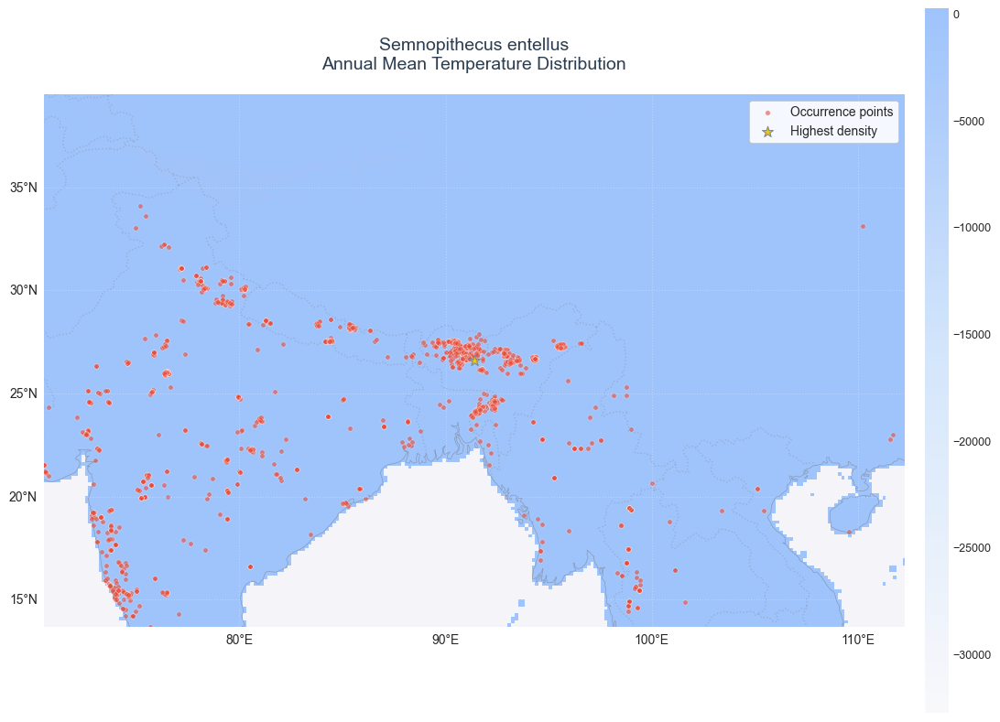


Creating faint plot for bio_12...
✓ Saved to /Users/divyadhole/Capstone-project/outputs/zoomed_bio_12_faint.png


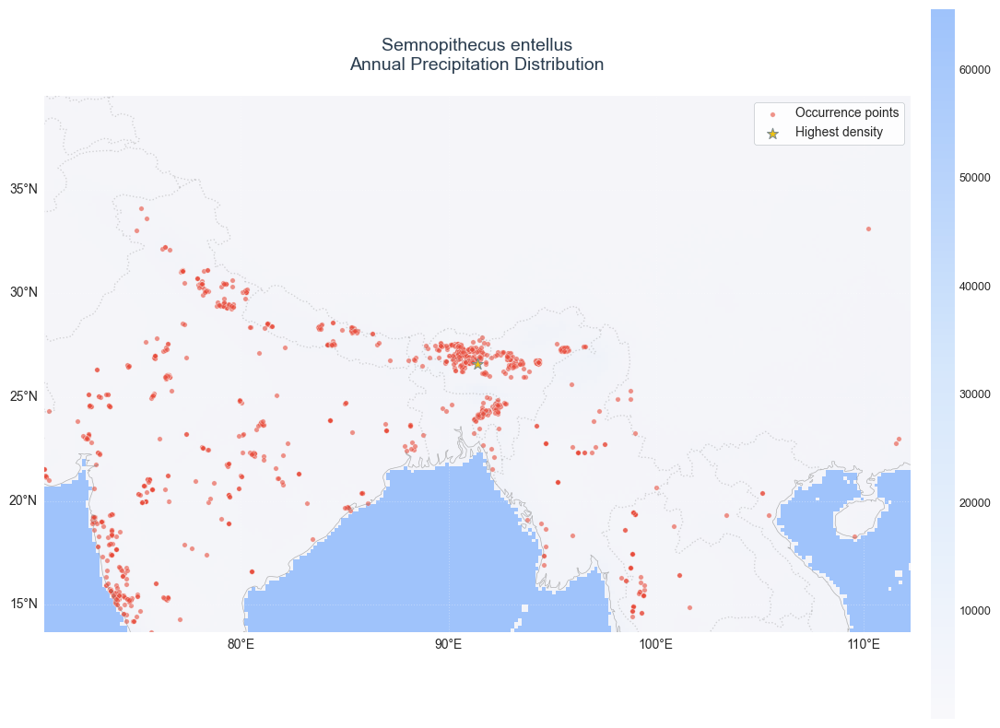


Creating faint plot for bio_4...
✓ Saved to /Users/divyadhole/Capstone-project/outputs/zoomed_bio_4_faint.png


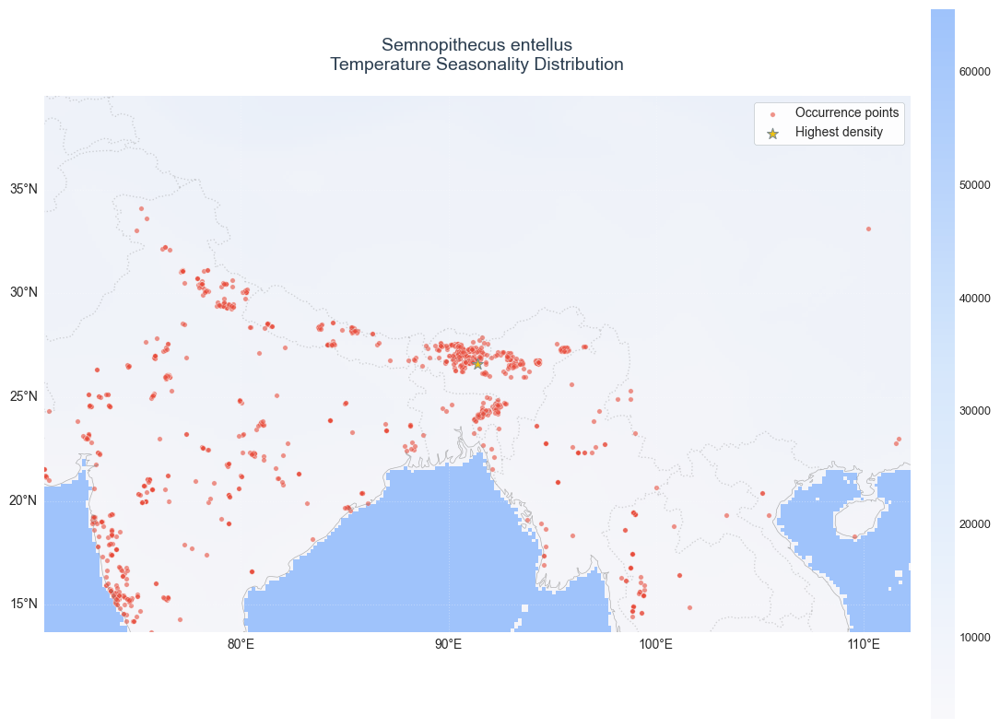

In [64]:
def plot_zoomed_bioclim_faint(bioclim_var, occurrence_data, time_period='10min', figsize=(12, 8), zoom_factor=1.5):
    """
    Create a zoomed-in map with a faint color scheme.
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import cartopy.crs as ccrs
    import cartopy.feature as cfeature
    import rasterio
    from rasterio.plot import show
    from scipy import stats
    from matplotlib.colors import LinearSegmentedColormap
    import matplotlib.colors as mcolors
    
    # Create a custom faint colormap (white to light blue)
    colors = [(1, 1, 1, 0.8),  # White with some transparency
              (0.8, 0.9, 1.0, 0.9),  # Very light blue
              (0.5, 0.7, 1.0, 1.0)]  # Light blue
    faint_cmap = LinearSegmentedColormap.from_list('faint_blue', colors, N=100)
    
    # Identify coordinate columns
    possible_lon = ['decimalLongitude', 'longitude', 'lon', 'x']
    possible_lat = ['decimalLatitude', 'latitude', 'lat', 'y']
    
    lon_col = next((col for col in possible_lon if col in occurrence_data.columns), None)
    lat_col = next((col for col in possible_lat if col in occurrence_data.columns), None)
    
    if not (lon_col and lat_col):
        print("Error: Could not identify coordinate columns in the data.")
        print("Available columns:", occurrence_data.columns.tolist())
        return
    
    # Convert to numeric and clean data
    occurrence_data = occurrence_data.copy()
    occurrence_data[lon_col] = pd.to_numeric(occurrence_data[lon_col], errors='coerce')
    occurrence_data[lat_col] = pd.to_numeric(occurrence_data[lat_col], errors='coerce')
    occurrence_data = occurrence_data.dropna(subset=[lon_col, lat_col])
    
    if occurrence_data.empty:
        print("Error: No valid coordinate data found.")
        return
    
    # Calculate the zoom area
    try:
        values = np.vstack([occurrence_data[lon_col], occurrence_data[lat_col]])
        kernel = stats.gaussian_kde(values)
        occurrence_data['density'] = kernel(values)
        max_density_idx = occurrence_data['density'].idxmax()
        center_lon = occurrence_data.loc[max_density_idx, lon_col]
        center_lat = occurrence_data.loc[max_density_idx, lat_col]
        
        lon_range = (occurrence_data[lon_col].max() - occurrence_data[lon_col].min()) / zoom_factor
        lat_range = (occurrence_data[lat_col].max() - occurrence_data[lat_col].min()) / zoom_factor
        
        min_lon = max(-180, center_lon - lon_range)
        max_lon = min(180, center_lon + lon_range)
        min_lat = max(-90, center_lat - lat_range)
        max_lat = min(90, center_lat + lat_range)
        
    except Exception as e:
        print(f"Using simple bounds: {e}")
        min_lon, max_lon = occurrence_data[lon_col].min(), occurrence_data[lon_col].max()
        min_lat, max_lat = occurrence_data[lat_col].min(), occurrence_data[lat_col].max()
        lon_pad = (max_lon - min_lon) * 0.1
        lat_pad = (max_lat - min_lat) * 0.1
        min_lon -= lon_pad
        max_lon += lon_pad
        min_lat -= lat_pad
        max_lat += lat_pad
    
    # Load and plot the data
    tif_file = f'/Users/divyadhole/Capstone-project/data/paleoclim/{time_period}/{bioclim_var}.tif'
    
    try:
        with rasterio.open(tif_file) as src:
            data = src.read(1)
            
            # Create figure with white background
            fig = plt.figure(figsize=figsize, facecolor='white')
            ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
            
            # Plot the raster with faint colors
            im = ax.imshow(
                data,
                extent=[src.bounds.left, src.bounds.right, 
                        src.bounds.bottom, src.bounds.top],
                origin='upper',
                transform=ccrs.PlateCarree(),
                cmap=faint_cmap,  # Using our faint colormap
                alpha=0.7,  # Make the colors more transparent
                vmin=np.nanpercentile(data, 5),  # Clip to remove outliers
                vmax=np.nanpercentile(data, 95)
            )
            
            # Add a subtle colorbar
            cbar = plt.colorbar(im, ax=ax, orientation='vertical', pad=0.02, aspect=30)
            cbar.outline.set_visible(False)
            cbar.ax.tick_params(labelsize=9)
            
            # Add very subtle grid lines
            gl = ax.gridlines(draw_labels=True, linestyle=':', alpha=0.3)
            gl.top_labels = False
            gl.right_labels = False
            
            # Add faint map features
            ax.add_feature(cfeature.COASTLINE, linewidth=0.5, alpha=0.5, edgecolor='gray')
            ax.add_feature(cfeature.BORDERS, linestyle=':', alpha=0.3, edgecolor='gray')
            ax.add_feature(cfeature.LAND, facecolor='none', edgecolor='gray', linewidth=0.3, alpha=0.5)
            
            # Plot occurrence points with a subtle style
            sc = ax.scatter(
                occurrence_data[lon_col],
                occurrence_data[lat_col],
                color='#E74C3C',  # Soft red
                s=15, 
                alpha=0.6, 
                transform=ccrs.PlateCarree(),
                edgecolor='white',
                linewidth=0.3,
                label='Occurrence points'
            )
            
            # Add the highest density point
            ax.scatter(
                center_lon, center_lat,
                color='#F1C40F',  # Soft yellow
                s=80, 
                marker='*',
                edgecolor='#7F8C8D',
                linewidth=0.8,
                transform=ccrs.PlateCarree(),
                label='Highest density'
            )
            
            # Set the extent
            ax.set_extent([min_lon, max_lon, min_lat, max_lat], crs=ccrs.PlateCarree())
            
            # Add a subtle title
            species = 'Species'
            if 'scientific_name' in occurrence_data.columns:
                species = occurrence_data['scientific_name'].iloc[0].split('(')[0].strip()
            
            var_name = {
                'bio_1': 'Annual Mean Temperature',
                'bio_12': 'Annual Precipitation',
                'bio_4': 'Temperature Seasonality'
            }.get(bioclim_var, bioclim_var.upper())
            
            plt.title(
                f'{species}\n{var_name} Distribution',
                fontsize=14, 
                pad=20,
                color='#2C3E50'  # Dark gray for better readability
            )
            
            # Add a subtle legend
            legend = ax.legend(
                loc='upper right',
                frameon=True,
                framealpha=0.9,
                edgecolor='#BDC3C7',
                facecolor='white'
            )
            legend.get_frame().set_linewidth(0.5)
            
            # Remove the box around the plot
            for spine in ax.spines.values():
                spine.set_visible(False)
            
            plt.tight_layout()
            
            # Save with a white background
            output_file = f'/Users/divyadhole/Capstone-project/outputs/zoomed_{bioclim_var}_faint.png'
            plt.savefig(output_file, dpi=300, bbox_inches='tight', facecolor='white')
            print(f"✓ Saved to {output_file}")
            
            plt.show()
            
    except Exception as e:
        print(f"Error creating plot: {e}")
        import traceback
        traceback.print_exc()

# Generate plots for each bioclimatic variable
if occurrence_data is not None and not occurrence_data.empty:
    # Try to identify coordinate columns
    lon_col = next((col for col in ['decimalLongitude', 'longitude', 'lon', 'x'] 
                   if col in occurrence_data.columns), None)
    lat_col = next((col for col in ['decimalLatitude', 'latitude', 'lat', 'y'] 
                   if col in occurrence_data.columns), None)
    
    if lon_col and lat_col:
        print(f"Using columns: {lon_col} for longitude, {lat_col} for latitude")
        
        # Plot different bioclimatic variables with the faint color scheme
        bioclim_vars = ['bio_1', 'bio_12', 'bio_4']
        
        for var in bioclim_vars:
            print(f"\nCreating faint plot for {var}...")
            plot_zoomed_bioclim_faint(var, occurrence_data, zoom_factor=2.0)
    else:
        print("Could not identify coordinate columns in the data.")
        print("Available columns:", occurrence_data.columns.tolist())
else:
    print("No occurrence data available to plot.")


Creating zoomed plot for bio_1...
✓ Plot saved to /Users/divyadhole/Capstone-project/outputs/bio_1_zoomed_plot.png


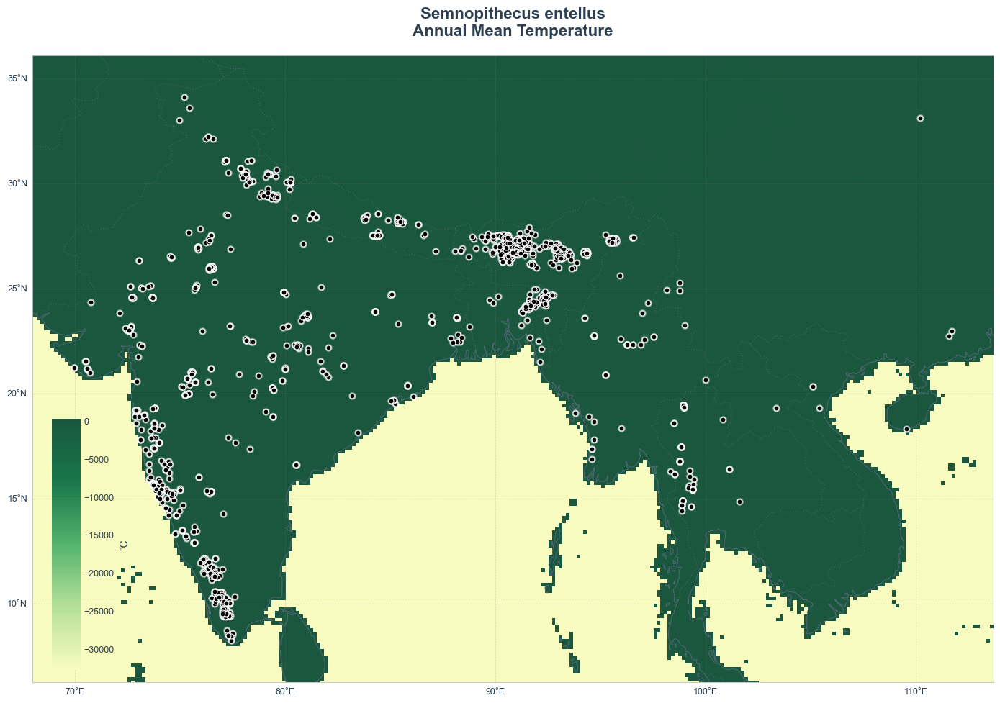


Creating zoomed plot for bio_12...
✓ Plot saved to /Users/divyadhole/Capstone-project/outputs/bio_12_zoomed_plot.png


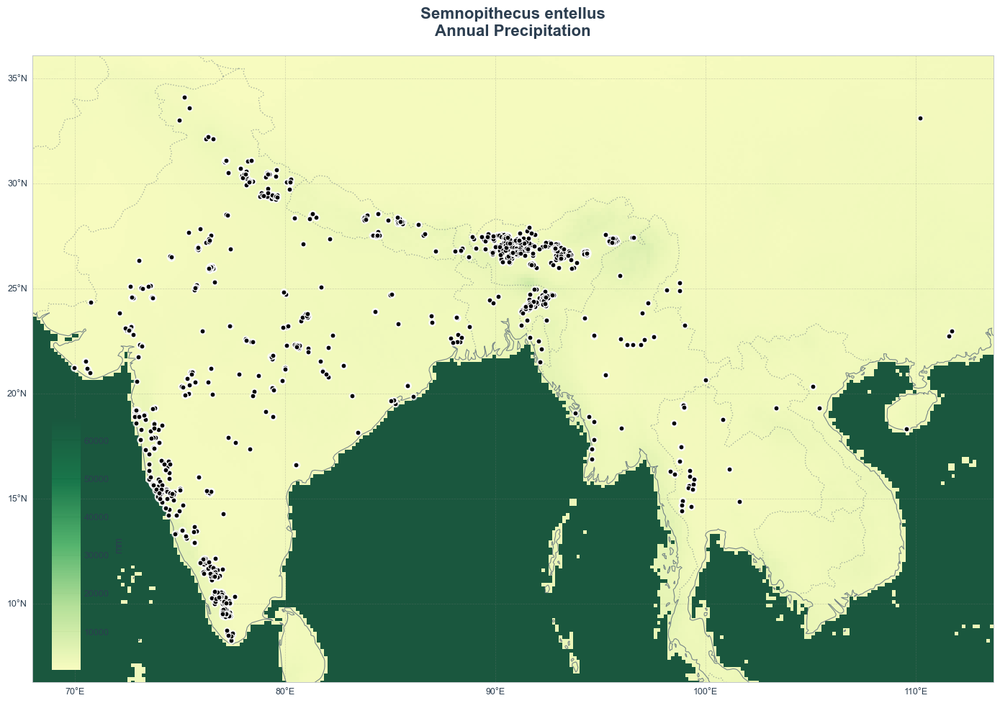


Creating zoomed plot for bio_4...
✓ Plot saved to /Users/divyadhole/Capstone-project/outputs/bio_4_zoomed_plot.png


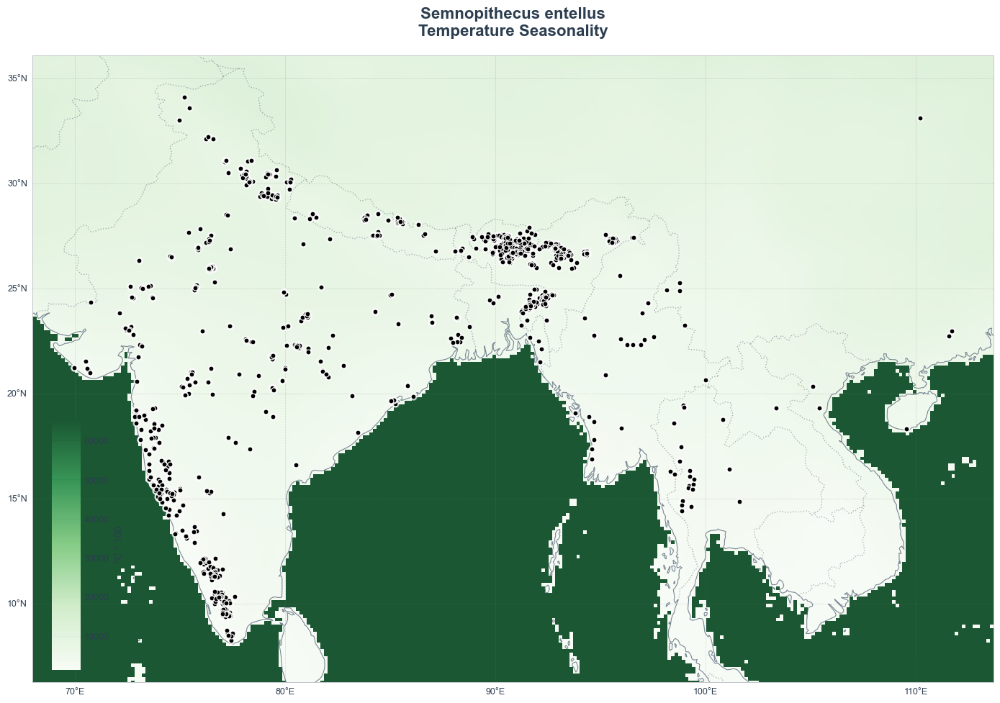

In [72]:
def create_zoomed_bioclim_plot(bioclim_var, occurrence_data, time_period='10min', figsize=(14, 10), padding=2.0):
    """
    Create a zoomed plot of bioclimatic data with black occurrence points.
    The map will be zoomed to show all occurrence points with some padding.
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import cartopy.crs as ccrs
    import cartopy.feature as cfeature
    import rasterio
    from matplotlib.colors import LinearSegmentedColormap
    from mpl_toolkits.axes_grid1.inset_locator import inset_axes
    
    # Set style with a light background
    plt.style.use('seaborn-v0_8-whitegrid')
    
    # Create figure with white background
    fig = plt.figure(figsize=figsize, facecolor='white')
    
    # First, determine the extent based on occurrence data
    if occurrence_data is not None and not occurrence_data.empty:
        # Try to identify coordinate columns
        lon_col = next((col for col in ['decimalLongitude', 'longitude', 'lon', 'x'] 
                      if col in occurrence_data.columns), None)
        lat_col = next((col for col in ['decimalLatitude', 'latitude', 'lat', 'y'] 
                      if col in occurrence_data.columns), None)
        
        if lon_col and lat_col:
            # Calculate data bounds with padding
            min_lon = occurrence_data[lon_col].min() - padding
            max_lon = occurrence_data[lon_col].max() + padding
            min_lat = occurrence_data[lat_col].min() - padding
            max_lat = occurrence_data[lat_col].max() + padding
            
            # Create map with calculated extent
            ax = plt.axes(projection=ccrs.PlateCarree())
            ax.set_extent([min_lon, max_lon, min_lat, max_lat], crs=ccrs.PlateCarree())
        else:
            ax = plt.axes(projection=ccrs.PlateCarree())
    else:
        ax = plt.axes(projection=ccrs.PlateCarree())
    
    # Add a light background color
    ax.set_facecolor('#f8f9fa')
    
    # Create colormap based on variable type
    if 'bio_1' in bioclim_var or 'bio_10' in bioclim_var or 'bio_11' in bioclim_var:
        cmap = LinearSegmentedColormap.from_list('temp', 
                                               ['#f7fcb9','#addd8e','#41ab5d','#006837','#004529'])
    elif 'bio_12' in bioclim_var or 'bio_13' in bioclim_var or 'bio_16' in bioclim_var:
        cmap = LinearSegmentedColormap.from_list('precip', 
                                               ['#f7fbff','#c6dbef','#6baed6','#3182bd','#08519c'])
    else:
        cmap = LinearSegmentedColormap.from_list('other', 
                                               ['#f7fcf5','#ccebc5','#78c679','#238b45','#00441b'])
    
    # Load and plot the raster data
    tif_file = f'/Users/divyadhole/Capstone-project/data/paleoclim/{time_period}/{bioclim_var}.tif'
    
    try:
        with rasterio.open(tif_file) as src:
            # Read the data
            data = src.read(1)
            
            # Calculate percentiles for better color scaling
            vmin = np.nanpercentile(data, 2)
            vmax = np.nanpercentile(data, 98)
            
            # Plot the raster
            im = ax.imshow(
                data,
                extent=[src.bounds.left, src.bounds.right, 
                        src.bounds.bottom, src.bounds.top],
                origin='upper',
                transform=ccrs.PlateCarree(),
                cmap=cmap,
                vmin=vmin,
                vmax=vmax,
                alpha=0.9
            )
            
            # Add map features
            ax.add_feature(cfeature.LAND, facecolor='none', edgecolor='#5D6D7E', 
                          linewidth=0.5, alpha=0.7)
            ax.add_feature(cfeature.COASTLINE, linewidth=0.8, edgecolor='#5D6D7E', alpha=0.8)
            ax.add_feature(cfeature.BORDERS, linestyle=':', alpha=0.5, edgecolor='#5D6D7E')
            
            # Add grid lines
            gl = ax.gridlines(
                draw_labels=True,
                linewidth=0.5, 
                color='gray', 
                alpha=0.3, 
                linestyle='--'
            )
            gl.top_labels = False
            gl.right_labels = False
            gl.xlabel_style = {'size': 9, 'color': '#2C3E50'}
            gl.ylabel_style = {'size': 9, 'color': '#2C3E50'}
            
            # Add occurrence points if available
            if occurrence_data is not None and not occurrence_data.empty and lon_col and lat_col:
                # Add a subtle white glow behind points
                ax.scatter(
                    occurrence_data[lon_col],
                    occurrence_data[lat_col],
                    s=45,
                    c='white',
                    alpha=0.4,
                    transform=ccrs.PlateCarree(),
                    zorder=4
                )
                # Add the main black points
                ax.scatter(
                    occurrence_data[lon_col],
                    occurrence_data[lat_col],
                    s=25,
                    c='black',
                    alpha=1.0,
                    edgecolor='white',
                    linewidth=0.8,
                    transform=ccrs.PlateCarree(),
                    label='Occurrence points',
                    zorder=5
                )
            
            # Add colorbar
            cax = inset_axes(
                ax,
                width="3%",
                height="40%",
                loc='lower left',
                bbox_to_anchor=(0.02, 0.02, 1, 1),
                bbox_transform=ax.transAxes,
                borderpad=0
            )
            
            cbar = plt.colorbar(im, cax=cax, orientation='vertical')
            cbar.outline.set_visible(False)
            cbar.ax.tick_params(labelsize=9, colors='#2C3E50')
            
            # Add units to colorbar
            units = {
                'bio_1': '°C', 'bio_2': '°C', 'bio_3': 'unitless', 
                'bio_4': '°C * 100', 'bio_5': '°C', 'bio_6': '°C',
                'bio_7': '°C', 'bio_8': '°C', 'bio_9': '°C',
                'bio_10': '°C', 'bio_11': '°C', 'bio_12': 'mm',
                'bio_13': 'mm', 'bio_14': 'mm', 'bio_15': 'unitless',
                'bio_16': 'mm', 'bio_17': 'mm', 'bio_18': 'mm',
                'bio_19': 'mm'
            }.get(bioclim_var, '')
            
            var_names = {
                'bio_1': 'Annual Mean Temperature',
                'bio_4': 'Temperature Seasonality',
                'bio_12': 'Annual Precipitation',
                'bio_13': 'Precipitation of Wettest Month',
                'bio_14': 'Precipitation of Driest Month',
                'bio_15': 'Precipitation Seasonality'
            }
            
            var_name = var_names.get(bioclim_var, bioclim_var.upper())
            
            cbar.set_label(units, fontsize=10, color='#2C3E50', labelpad=5)
            
            # Add title
            if 'scientific_name' in occurrence_data.columns:
                species_name = occurrence_data['scientific_name'].iloc[0].split('(')[0].strip()
                title = f"{species_name}\n{var_name}"
            else:
                title = var_name
                
            ax.set_title(
                title,
                fontsize=16,
                fontweight='bold',
                pad=20,
                color='#2C3E50'
            )
            
            # Add a subtle border
            for spine in ax.spines.values():
                spine.set_visible(True)
                spine.set_color('#BDC3C7')
                spine.set_linewidth(0.5)
            
            plt.tight_layout()
            
            # Save the figure
            output_file = f'/Users/divyadhole/Capstone-project/outputs/{bioclim_var}_zoomed_plot.png'
            plt.savefig(output_file, dpi=300, bbox_inches='tight', facecolor='white')
            print(f"✓ Plot saved to {output_file}")
            
            plt.show()
            
    except Exception as e:
        print(f"Error creating plot: {e}")
        import traceback
        traceback.print_exc()

# Example usage
if 'occurrence_data' in locals() and occurrence_data is not None and not occurrence_data.empty:
    # Create plots for each bioclimatic variable
    bioclim_vars = ['bio_1', 'bio_12', 'bio_4']  # Annual Mean Temp, Annual Precip, Temp Seasonality
    
    for var in bioclim_vars:
        print(f"\nCreating zoomed plot for {var}...")
        create_zoomed_bioclim_plot(var, occurrence_data, padding=2.0)  # Adjust padding as needed
else:
    print("No occurrence data available to plot. Please load your data first.")

In [76]:
# Check the Late Holocene data file
import rasterio
import numpy as np

# Path to the Late Holocene bio_1 file
lh_file = '/Users/divyadhole/Capstone-project/data/paleoclim/LH_v1_2_5m/bio_1.tif'

try:
    with rasterio.open(lh_file) as src:
        data = src.read(1)
        print(f"Data shape: {data.shape}")
        print(f"Min value: {np.nanmin(data)}")
        print(f"Max value: {np.nanmax(data)}")
        print(f"Number of NaN values: {np.isnan(data).sum()}")
        print(f"Number of zero values: {(data == 0).sum()}")
        print(f"Data type: {data.dtype}")
except Exception as e:
    print(f"Error reading file: {e}")

Data shape: (4176, 8640)
Min value: -32768
Max value: 314
Number of NaN values: 0
Number of zero values: 42781
Data type: int16


Found 11 unique species in the data:
1. Semnopithecus entellus (Dufresne, 1797)
2. Semnopithecus hypoleucos Blyth, 1841
3. Semnopithecus dussumieri I.Geoffroy Saint-Hilaire, 1843
4. Semnopithecus schistaceus Hodgson, 1840
5. Trachypithecus geei Khajuria, 1956
6. Presbytis geei Khajuria, 1956
7. Semnopithecus johnii (J.Fischer, 1829)
8. Trachypithecus phayrei (Blyth, 1847)
9. Presbytis phayrei Blyth, 1847
10. Trachypithecus pileatus (Blyth, 1843)
11. Trachypithecus pileatus tenebricus (Hinton, 1923)

Found matching species: Semnopithecus hypoleucos Blyth, 1841
Creating comparison plot...
✓ Plot saved to /Users/divyadhole/Capstone-project/outputs/species_comparisons/Semnopithecus_hypoleucos_Blyth,_1841_bio_1_comparison.png


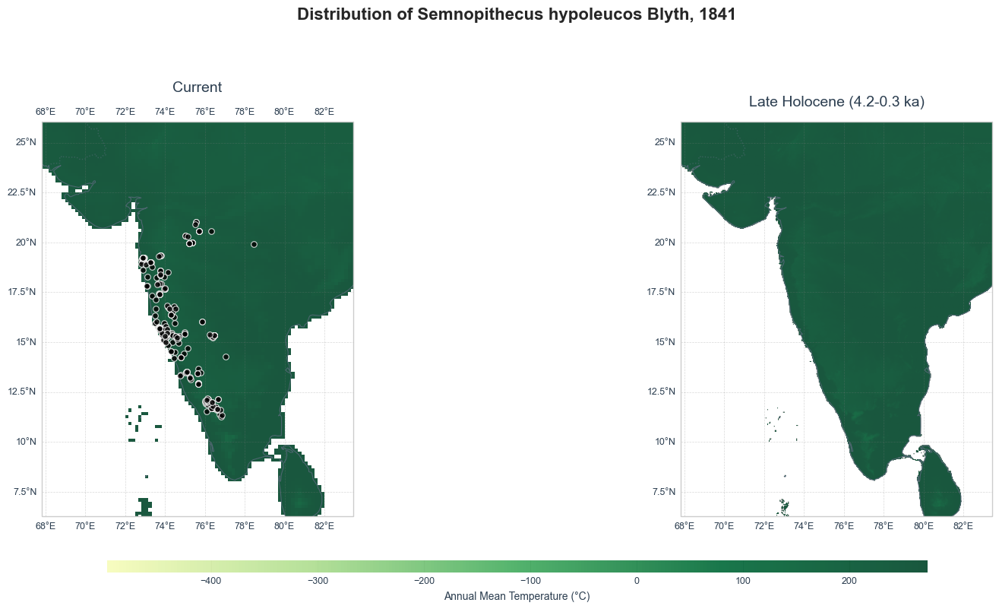

In [78]:
# Load the occurrence data
occurrence_file = '/Users/divyadhole/Capstone-project/outputs/occurrence_points_gbif.csv'
if os.path.exists(occurrence_file):
    occurrence_data = pd.read_csv(occurrence_file)
    
    # Get unique species
    unique_species = occurrence_data['scientific_name'].unique()
    
    print(f"Found {len(unique_species)} unique species in the data:")
    for i, species in enumerate(unique_species, 1):
        print(f"{i}. {species}")
    
    # Find the exact match for Semnopithecus hypoleucos
    target_species = [s for s in unique_species if "Semnopithecus hypoleucos" in s]
    
    if target_species:
        print(f"\nFound matching species: {target_species[0]}")
        print("Creating comparison plot...")
        plot_species_comparison(
            species_name=target_species[0],  # Use the exact name from the data
            current_data=occurrence_data,
            time_periods=['10min', 'LH_v1_2_5m'],
            bioclim_var='bio_1'  # Using Annual Mean Temperature
        )
    else:
        print("\nNo matching species found. Available species are:")
        for species in unique_species:
            print(f"- {species}")
else:
    print(f"Occurrence data file not found: {occurrence_file}")

Found 11 unique species in the data:
1. Semnopithecus entellus (Dufresne, 1797)
2. Semnopithecus hypoleucos Blyth, 1841
3. Semnopithecus dussumieri I.Geoffroy Saint-Hilaire, 1843
4. Semnopithecus schistaceus Hodgson, 1840
5. Trachypithecus geei Khajuria, 1956
6. Presbytis geei Khajuria, 1956
7. Semnopithecus johnii (J.Fischer, 1829)
8. Trachypithecus phayrei (Blyth, 1847)
9. Presbytis phayrei Blyth, 1847
10. Trachypithecus pileatus (Blyth, 1843)
11. Trachypithecus pileatus tenebricus (Hinton, 1923)

Found matching species: Semnopithecus hypoleucos Blyth, 1841

Creating temperature comparison plot...
✓ Plot saved to /Users/divyadhole/Capstone-project/outputs/species_comparisons/Semnopithecus_hypoleucos_Blyth,_1841_bio_1_comparison.png


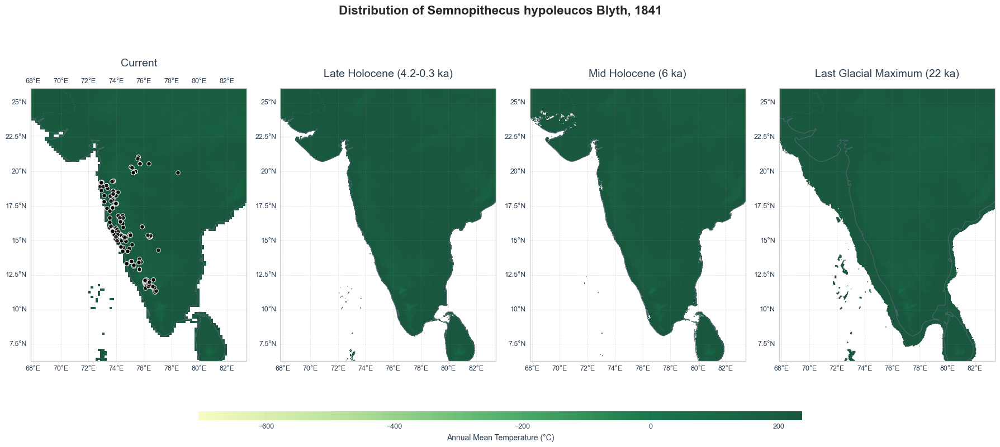


Creating precipitation comparison plot...
✓ Plot saved to /Users/divyadhole/Capstone-project/outputs/species_comparisons/Semnopithecus_hypoleucos_Blyth,_1841_bio_12_comparison.png


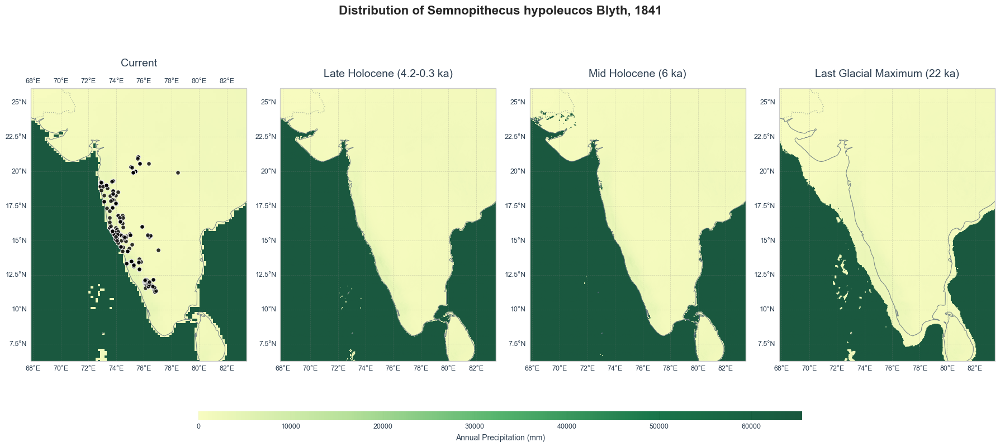

In [79]:
def plot_species_distribution(species_name, current_data, time_periods, bioclim_var='bio_1', figsize=(18, 8)):
    """
    Plot species distribution across different time periods.
    """
    # Filter data for the target species
    species_data = current_data[current_data['scientific_name'].str.startswith(species_name.split('(')[0].strip())]
    
    if species_data.empty:
        print(f"No data found for species: {species_name}")
        return
    
    # Create figure with subplots
    fig, axes = plt.subplots(1, len(time_periods), 
                            figsize=figsize, 
                            subplot_kw={'projection': ccrs.PlateCarree()})
    
    # Make sure axes is always a list for consistent handling
    if len(time_periods) == 1:
        axes = [axes]
    
    # Set a title for the entire figure
    fig.suptitle(f"Distribution of {species_name}\n", fontsize=16, fontweight='bold')
    
    # Define a colormap for the bioclimatic variable
    if 'bio_1' in bioclim_var or 'bio_10' in bioclim_var or 'bio_11' in bioclim_var:
        cmap = LinearSegmentedColormap.from_list('temp', 
                                               ['#f7fcb9','#addd8e','#41ab5d','#006837','#004529'])
    elif 'bio_12' in bioclim_var or 'bio_13' in bioclim_var or 'bio_16' in bioclim_var:
        cmap = LinearSegmentedColormap.from_list('precip', 
                                               ['#f7fbff','#c6dbef','#6baed6','#3182bd','#08519c'])
    else:
        cmap = LinearSegmentedColormap.from_list('other', 
                                               ['#f7fcf5','#ccebc5','#78c679','#238b45','#00441b'])
    
    # Get the extent from the occurrence data
    lon_col = next((col for col in ['decimalLongitude', 'longitude', 'lon', 'x'] 
                   if col in species_data.columns), None)
    lat_col = next((col for col in ['decimalLatitude', 'latitude', 'lat', 'y'] 
                   if col in species_data.columns), None)
    
    if not lon_col or not lat_col:
        print("Could not find longitude/latitude columns in the data")
        return
    
    # Calculate padding for the map extent
    padding = 5.0  # degrees of padding around points
    
    # Initialize im as None to check later if any plots were successful
    im = None
    
    # Plot each time period
    for i, period in enumerate(time_periods):
        ax = axes[i]
        
        # Set the time period name for display
        period_names = {
            '10min': 'Current',
            'LH_v1_2_5m': 'Late Holocene (4.2-0.3 ka)',
            'MH_v1_2_5m': 'Mid Holocene (6 ka)',
            'LIG_v1_10m': 'Last Interglacial (130 ka)',
            'LGM_v1_2_5m': 'Last Glacial Maximum (22 ka)'
        }
        period_name = period_names.get(period, period)
        
        # Load the bioclimatic data
        tif_file = f'/Users/divyadhole/Capstone-project/data/paleoclim/{period}/{bioclim_var}.tif'
        
        try:
            with rasterio.open(tif_file) as src:
                data = src.read(1)
                
                # Handle nodata values
                data = data.astype(np.float32)
                data[data == -32768] = np.nan
                
                # Calculate percentiles for better color scaling, ignoring NaNs
                vmin = np.nanpercentile(data, 2)
                vmax = np.nanpercentile(data, 98)
                
                # Plot the raster
                im = ax.imshow(
                    data,
                    extent=[src.bounds.left, src.bounds.right, 
                            src.bounds.bottom, src.bounds.top],
                    origin='upper',
                    transform=ccrs.PlateCarree(),
                    cmap=cmap,
                    vmin=vmin,
                    vmax=vmax,
                    alpha=0.9
                )
                
                # Add map features
                ax.add_feature(cfeature.LAND, facecolor='#f5f5f5', edgecolor='#5D6D7E', 
                              linewidth=0.5, alpha=0.7)
                ax.add_feature(cfeature.COASTLINE, linewidth=0.8, edgecolor='#5D6D7E', alpha=0.8)
                ax.add_feature(cfeature.BORDERS, linestyle=':', alpha=0.5, edgecolor='#5D6D7E')
                
                # Add grid lines
                gl = ax.gridlines(
                    draw_labels=True,
                    linewidth=0.5, 
                    color='gray', 
                    alpha=0.3, 
                    linestyle='--'
                )
                gl.top_labels = i == 0
                gl.right_labels = False
                gl.xlabel_style = {'size': 9, 'color': '#2C3E50'}
                gl.ylabel_style = {'size': 9, 'color': '#2C3E50'}
                
                # Add occurrence points (only for current period)
                if period == '10min' and not species_data.empty:
                    ax.scatter(
                        species_data[lon_col],
                        species_data[lat_col],
                        s=30,
                        c='black',
                        alpha=0.8,
                        edgecolor='white',
                        linewidth=0.8,
                        transform=ccrs.PlateCarree(),
                        label='Occurrence points',
                        zorder=5
                    )
                
                # Set the title for this subplot
                ax.set_title(period_name, fontsize=14, pad=15, color='#2C3E50')
                
                # Set the extent to focus on the species' range
                if not species_data.empty:
                    min_lon, max_lon = species_data[lon_col].min(), species_data[lon_col].max()
                    min_lat, max_lat = species_data[lat_col].min(), species_data[lat_col].max()
                    ax.set_extent([
                        min_lon - padding, 
                        max_lon + padding, 
                        min_lat - padding, 
                        max_lat + padding
                    ], crs=ccrs.PlateCarree())
                
        except Exception as e:
            print(f"Error loading {tif_file}: {e}")
            # Create an empty plot with error message
            ax.set_facecolor('#f8f9fa')
            ax.text(0.5, 0.5, f"Error loading {period} data", 
                   ha='center', va='center', transform=ax.transAxes,
                   color='red', fontsize=12)
            continue
    
    # Only add colorbar if at least one plot was successful
    if im is not None:
        # Add a colorbar
        cax = fig.add_axes([0.2, 0.05, 0.6, 0.02])  # [left, bottom, width, height]
        cbar = plt.colorbar(im, cax=cax, orientation='horizontal')
        cbar.outline.set_visible(False)
        cbar.ax.tick_params(labelsize=9, colors='#2C3E50')
        
        # Add units to colorbar
        units = {
            'bio_1': '°C', 'bio_12': 'mm'
        }.get(bioclim_var, 'units')
        
        var_names = {
            'bio_1': 'Annual Mean Temperature',
            'bio_12': 'Annual Precipitation'
        }
        
        var_name = var_names.get(bioclim_var, bioclim_var.upper())
        cbar.set_label(f'{var_name} ({units})', fontsize=10, color='#2C3E50', labelpad=5)
    
    # Adjust layout
    plt.tight_layout(rect=[0, 0.1, 1, 0.95])  # Leave space for the colorbar
    
    # Save the figure
    output_dir = '/Users/divyadhole/Capstone-project/outputs/species_comparisons'
    os.makedirs(output_dir, exist_ok=True)
    safe_species_name = species_name.split('(')[0].strip().replace(' ', '_')
    output_file = f'{output_dir}/{safe_species_name}_{bioclim_var}_comparison.png'
    plt.savefig(output_file, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"✓ Plot saved to {output_file}")
    
    plt.show()

# Load the occurrence data
occurrence_file = '/Users/divyadhole/Capstone-project/outputs/occurrence_points_gbif.csv'
if os.path.exists(occurrence_file):
    occurrence_data = pd.read_csv(occurrence_file)
    
    # Get unique species
    unique_species = occurrence_data['scientific_name'].unique()
    
    print(f"Found {len(unique_species)} unique species in the data:")
    for i, species in enumerate(unique_species, 1):
        print(f"{i}. {species}")
    
    # Find the exact match for Semnopithecus hypoleucos
    target_species = [s for s in unique_species if "Semnopithecus hypoleucos" in s]
    
    if target_species:
        species_name = target_species[0]
        print(f"\nFound matching species: {species_name}")
        
        # Define the time periods to compare
        time_periods = ['10min', 'LH_v1_2_5m', 'MH_v1_2_5m', 'LGM_v1_2_5m']
        
        # Plot temperature comparison
        print("\nCreating temperature comparison plot...")
        plot_species_distribution(
            species_name=species_name,
            current_data=occurrence_data,
            time_periods=time_periods,
            bioclim_var='bio_1'  # Annual Mean Temperature
        )
        
        # Plot precipitation comparison
        print("\nCreating precipitation comparison plot...")
        plot_species_distribution(
            species_name=species_name,
            current_data=occurrence_data,
            time_periods=time_periods,
            bioclim_var='bio_12'  # Annual Precipitation
        )
    else:
        print("\nNo matching species found. Available species are:")
        for species in unique_species:
            print(f"- {species}")
else:
    print(f"Occurrence data file not found: {occurrence_file}")

In [80]:
!pip install pygbif

  Using cached requests_cache-1.2.1-py3-none-any.whl.metadata (9.9 kB)
  Using cached geomet-1.1.0-py3-none-any.whl.metadata (11 kB)
  Using cached cattrs-25.3.0-py3-none-any.whl.metadata (8.4 kB)
  Using cached url_normalize-2.2.1-py3-none-any.whl.metadata (5.6 kB)
Using cached geomet-1.1.0-py3-none-any.whl (31 kB)
Using cached requests_cache-1.2.1-py3-none-any.whl (61 kB)
Using cached cattrs-25.3.0-py3-none-any.whl (70 kB)
Using cached url_normalize-2.2.1-py3-none-any.whl (14 kB)


In [89]:
from pygbif import occurrences as occ
import pandas as pd
from datetime import datetime

def check_species_availability(species_list):
    """Check data availability for a list of species on GBIF."""
    results = []
    
    for species in species_list:
        try:
            print(f"\nChecking data for {species}...")
            
            # First check current data (2000-2025)
            current = occ.search(
                scientificName=species,
                hasCoordinate=True,
                year="2000,2025",
                limit=1  # We just need to check if data exists
            )
            
            # Then check historical data (pre-2000)
            historical = occ.search(
                scientificName=species,
                hasCoordinate=True,
                year="1,1999",
                limit=1  # We just need to check if data exists
            )
            
            # Get total counts
            current_count = current.get('count', 0) if current else 0
            historical_count = historical.get('count', 0) if historical else 0
            
            results.append({
                'species': species,
                'current_records': current_count,
                'historical_records': historical_count,
                'total_records': current_count + historical_count
            })
            
            print(f"  - Current (2000-2025): {current_count} records")
            print(f"  - Historical (pre-2000): {historical_count} records")
            print(f"  - Total: {current_count + historical_count} records")
            
        except Exception as e:
            print(f"Error checking {species}: {str(e)[:200]}...")
            results.append({
                'species': species,
                'current_records': 0,
                'historical_records': 0,
                'total_records': 0,
                'error': str(e)[:200]
            })
    
    return pd.DataFrame(results)

# List of species to check
species_to_check = [
    "Semnopithecus hypoleucos",
    "Semnopithecus dussumieri",
    "Semnopithecus entellus",
    "Trachypithecus geei",
    "Trachypithecus pileatus"
]

# Check availability
print("Checking data availability on GBIF...")
availability_df = check_species_availability(species_to_check)

# Display results
print("\nData Availability Summary:")
print(availability_df[['species', 'current_records', 'historical_records', 'total_records']])

Checking data availability on GBIF...

Checking data for Semnopithecus hypoleucos...
  - Current (2000-2025): 525 records
  - Historical (pre-2000): 12 records
  - Total: 537 records

Checking data for Semnopithecus dussumieri...
  - Current (2000-2025): 525 records
  - Historical (pre-2000): 12 records
  - Total: 537 records

Checking data for Semnopithecus entellus...
  - Current (2000-2025): 1735 records
  - Historical (pre-2000): 91 records
  - Total: 1826 records

Checking data for Trachypithecus geei...
  - Current (2000-2025): 159 records
  - Historical (pre-2000): 2 records
  - Total: 161 records

Checking data for Trachypithecus pileatus...
  - Current (2000-2025): 362 records
  - Historical (pre-2000): 2 records
  - Total: 364 records

Data Availability Summary:
                    species  current_records  historical_records  \
0  Semnopithecus hypoleucos              525                  12   
1  Semnopithecus dussumieri              525                  12   
2    Semnopit


✅ Saved improved temporal analysis to /Users/divyadhole/Capstone-project/outputs/species_occurrences/improved_temporal_analysis.png


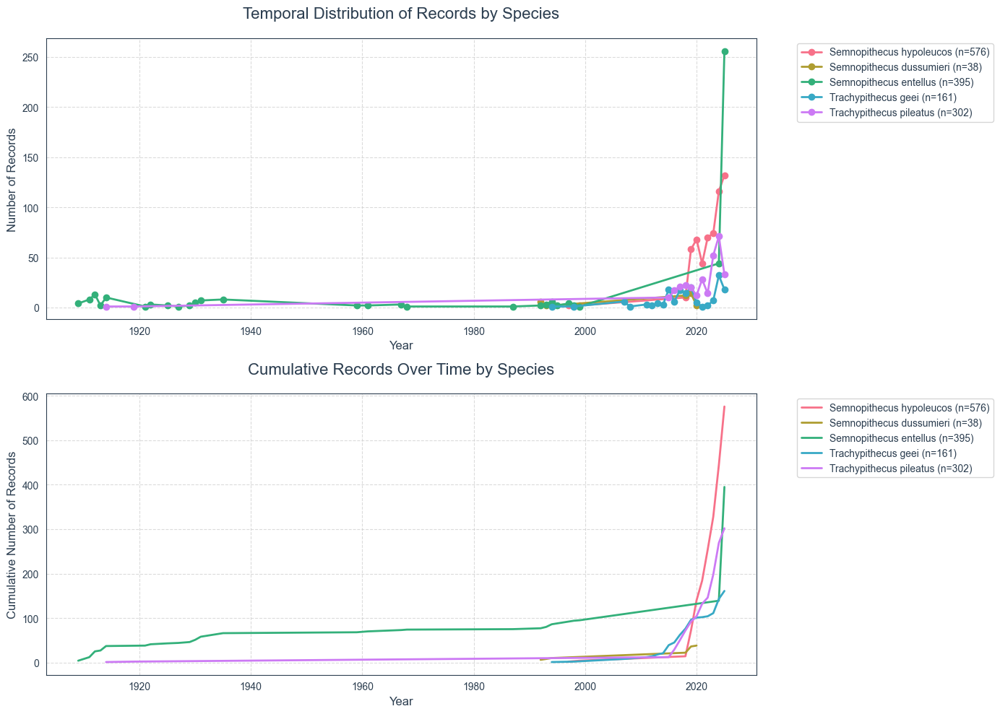

In [94]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Set style
plt.style.use('default')
sns.set_style("whitegrid")
plt.rcParams.update({
    'figure.facecolor': 'white',
    'axes.facecolor': 'white',
    'axes.edgecolor': '#2c3e50',
    'axes.labelcolor': '#2c3e50',
    'text.color': '#2c3e50',
    'xtick.color': '#2c3e50',
    'ytick.color': '#2c3e50',
    'font.family': 'sans-serif'
})

# Create figure
plt.figure(figsize=(14, 10))

# 1. Temporal distribution by species
plt.subplot(2, 1, 1)

# Create a color palette
palette = sns.color_palette("husl", len(target_species))
species_colors = dict(zip(target_species, palette))

# Plot each species' temporal distribution
for i, species in enumerate(target_species):
    species_data = df[df['species_standardized'] == species]
    if not species_data.empty:
        # Get yearly counts
        yearly_counts = species_data['year'].value_counts().sort_index()
        plt.plot(yearly_counts.index, yearly_counts.values, 
                label=f'{species} (n={len(species_data)})',
                color=species_colors[species],
                linewidth=2,
                marker='o')

plt.title('Temporal Distribution of Records by Species', fontsize=16, pad=20)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Number of Records', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# 2. Cumulative records over time
plt.subplot(2, 1, 2)

for species in target_species:
    species_data = df[df['species_standardized'] == species]
    if not species_data.empty:
        # Sort by year and calculate cumulative sum
        species_yearly = species_data['year'].value_counts().sort_index()
        species_cumulative = species_yearly.cumsum()
        
        plt.plot(species_cumulative.index, species_cumulative.values,
                label=f'{species} (n={len(species_data)})',
                color=species_colors[species],
                linewidth=2)

plt.title('Cumulative Records Over Time by Species', fontsize=16, pad=20)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Cumulative Number of Records', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout
plt.tight_layout()

# Save the plot
temporal_plot = os.path.join(os.path.dirname(data_file), 'improved_temporal_analysis.png')
plt.savefig(temporal_plot, dpi=300, bbox_inches='tight')
print(f"\n✅ Saved improved temporal analysis to {temporal_plot}")

plt.show()


✅ Saved species distribution plot to /Users/divyadhole/Capstone-project/outputs/species_occurrences/species_distributions.png


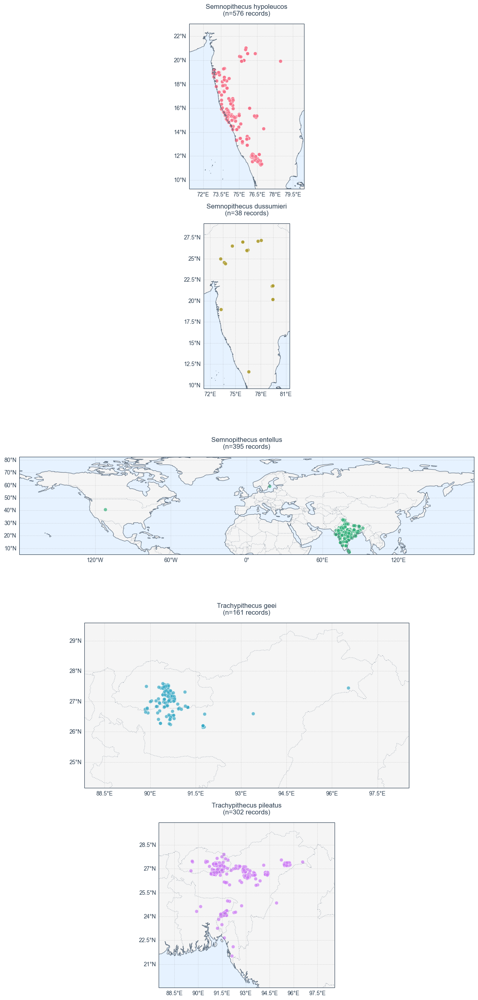

In [95]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature

def plot_species_distribution(species_data, species_name, ax):
    """Plot distribution of a single species."""
    # Add map features
    ax.add_feature(cfeature.LAND, facecolor='#f5f5f5', edgecolor='none')
    ax.add_feature(cfeature.COASTLINE, linewidth=0.8, edgecolor='#5D6D7E')
    ax.add_feature(cfeature.BORDERS, linestyle=':', alpha=0.5, edgecolor='#5D6D7E')
    ax.add_feature(cfeature.OCEAN, facecolor='#e6f2ff')
    
    if not species_data.empty:
        # Plot points
        scatter = ax.scatter(
            species_data['longitude'],
            species_data['latitude'],
            c=species_colors[species_name],
            s=40,
            alpha=0.7,
            edgecolor='white',
            linewidth=0.5,
            transform=ccrs.PlateCarree(),
            label=f'Records: {len(species_data)}'
        )
        
        # Set the map extent with padding
        if len(species_data) > 1:
            margin = 2  # degrees of padding
            ax.set_extent([
                species_data['longitude'].min() - margin,
                species_data['longitude'].max() + margin,
                species_data['latitude'].min() - margin,
                species_data['latitude'].max() + margin
            ])
    
    # Add title
    ax.set_title(f"{species_name}\n(n={len(species_data)} records)", 
                fontsize=12, pad=15, color='#2c3e50')
    
    # Add grid lines
    gl = ax.gridlines(draw_labels=True, linewidth=0.5, 
                     color='gray', alpha=0.3, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False

# Create a figure with subplots for each species
n_species = len(target_species)
fig, axes = plt.subplots(
    n_species, 1, 
    figsize=(12, 5 * n_species),
    subplot_kw={'projection': ccrs.PlateCarree()}
)

# If only one species, convert axes to list
if n_species == 1:
    axes = [axes]

# Plot each species
for i, species in enumerate(target_species):
    species_data = df[df['species_standardized'] == species]
    plot_species_distribution(species_data, species, axes[i])

plt.tight_layout()

# Save the plot
spatial_plot = os.path.join(os.path.dirname(data_file), 'species_distributions.png')
plt.savefig(spatial_plot, dpi=300, bbox_inches='tight')
print(f"\n✅ Saved species distribution plot to {spatial_plot}")

plt.show()

In [96]:
# Create a summary DataFrame
summary_data = []
for species in target_species:
    species_data = df[df['species_standardized'] == species]
    if not species_data.empty:
        summary_data.append({
            'Species': species,
            'Total Records': len(species_data),
            'Earliest Year': int(species_data['year'].min()),
            'Latest Year': int(species_data['year'].max()),
            'Time Period (years)': int(species_data['year'].max() - species_data['year'].min() + 1),
            'Countries': ', '.join(species_data['country'].dropna().unique()) if 'country' in species_data.columns else 'N/A'
        })

# Create and display summary table
summary_df = pd.DataFrame(summary_data)
print("\n" + "="*80)
print("SPECIES OCCURRENCE DATA SUMMARY")
print("="*80)
print(summary_df.to_string(index=False))

# Save summary to CSV
summary_file = os.path.join(os.path.dirname(data_file), 'species_summary.csv')
summary_df.to_csv(summary_file, index=False)
print(f"\n✅ Saved species summary to {summary_file}")


SPECIES OCCURRENCE DATA SUMMARY
                 Species  Total Records  Earliest Year  Latest Year  Time Period (years) Countries
Semnopithecus hypoleucos            576           1997         2025                   29       N/A
Semnopithecus dussumieri             38           1992         2020                   29       N/A
  Semnopithecus entellus            395           1909         2025                  117       N/A
     Trachypithecus geei            161           1994         2025                   32       N/A
 Trachypithecus pileatus            302           1914         2025                  112       N/A

✅ Saved species summary to /Users/divyadhole/Capstone-project/outputs/species_occurrences/species_summary.csv


✅ Saved map visualization to /Users/divyadhole/Capstone-project/outputs/species_occurrences/map_visualization.png


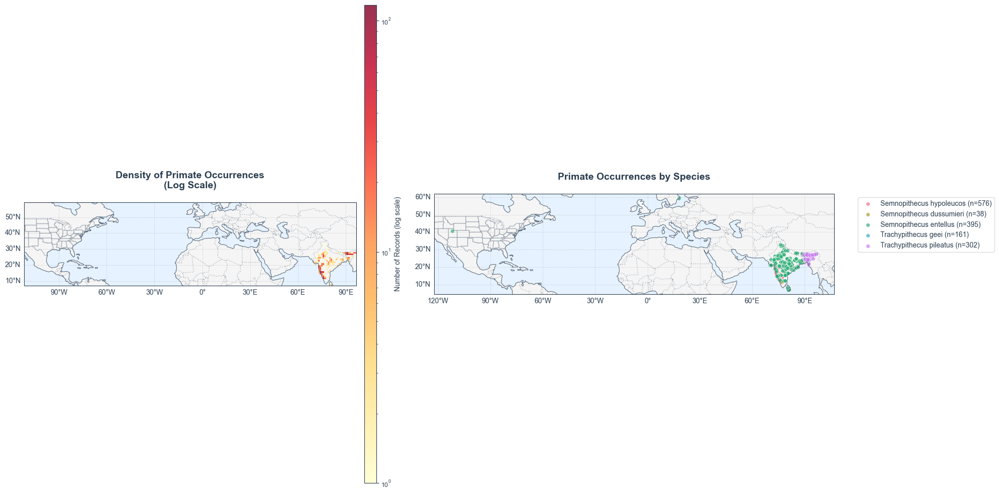

In [104]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.colors as mcolors
from matplotlib.colors import LogNorm

# Create figure with two subplots
fig = plt.figure(figsize=(20, 10))

# Define the projection
projection = ccrs.PlateCarree()

# Create subplots
ax1 = fig.add_subplot(121, projection=projection)  # For heatmap
ax2 = fig.add_subplot(122, projection=projection)  # For scatter plot

# Function to add map features
def setup_map(ax, title):
    # Add map features
    ax.add_feature(cfeature.LAND, facecolor='#f5f5f5')
    ax.add_feature(cfeature.OCEAN, facecolor='#e6f2ff')
    ax.add_feature(cfeature.COASTLINE, linewidth=0.8, edgecolor='#5D6D7E')
    ax.add_feature(cfeature.BORDERS, linestyle=':', alpha=0.5, edgecolor='#5D6D7E')
    ax.add_feature(cfeature.STATES, linestyle='-', alpha=0.3, edgecolor='#5D6D7E')
    
    # Add gridlines
    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.3, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 10, 'color': '#2c3e50'}
    gl.ylabel_style = {'size': 10, 'color': '#2c3e50'}
    
    # Set title
    ax.set_title(title, fontsize=14, pad=20, fontweight='bold')

# 1. Heatmap
setup_map(ax1, 'Density of Primate Occurrences\n(Log Scale)')

# Create 2D histogram (heatmap)
if not df.empty and 'longitude' in df.columns and 'latitude' in df.columns:
    # Calculate appropriate bin sizes based on data range
    lon_min, lon_max = df['longitude'].min(), df['longitude'].max()
    lat_min, lat_max = df['latitude'].min(), df['latitude'].max()
    lon_bins = int((lon_max - lon_min) / 1)  # 1 degree bins
    lat_bins = int((lat_max - lat_min) / 1)  # 1 degree bins
    
    # Create heatmap
    heatmap, xedges, yedges = np.histogram2d(
        df['longitude'], 
        df['latitude'],
        bins=[max(10, lon_bins), max(10, lat_bins)]  # Ensure minimum of 10 bins
    )
    
    # Plot heatmap with log scale
    heatmap = heatmap.T  # Transpose for correct orientation
    im = ax1.pcolormesh(xedges, yedges, heatmap, 
                       cmap='YlOrRd',  # Yellow-Orange-Red colormap
                       norm=LogNorm(vmin=1, vmax=heatmap.max()),  # Log scale
                       alpha=0.8)
    
    # Add colorbar
    cbar = plt.colorbar(im, ax=ax1, orientation='vertical', pad=0.02, aspect=40)
    cbar.set_label('Number of Records (log scale)', fontsize=10)
    cbar.ax.tick_params(labelsize=9)

# 2. Scatter plot by species
setup_map(ax2, 'Primate Occurrences by Species')

# Create a color palette
palette = sns.color_palette("husl", len(target_species))

# Plot each species with different colors
for i, species in enumerate(target_species):
    species_data = df[df['species_standardized'] == species]
    if not species_data.empty:
        ax2.scatter(
            species_data['longitude'],
            species_data['latitude'],
            color=palette[i],
            s=30,
            alpha=0.7,
            edgecolor='white',
            linewidth=0.5,
            label=f"{species} (n={len(species_data)})",
            transform=ccrs.PlateCarree()
        )

# Add legend
ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left', 
          frameon=True, framealpha=1, edgecolor='#dddddd')

# Adjust layout
plt.tight_layout()

# Save the plot
output_file = '/Users/divyadhole/Capstone-project/outputs/species_occurrences/map_visualization.png'
plt.savefig(output_file, dpi=300, bbox_inches='tight')
print(f"✅ Saved map visualization to {output_file}")

plt.show()

✅ Saved comparison plot to /Users/divyadhole/Capstone-project/outputs/species_occurrences/Semnopithecus_entellus_2024_vs_2025.png


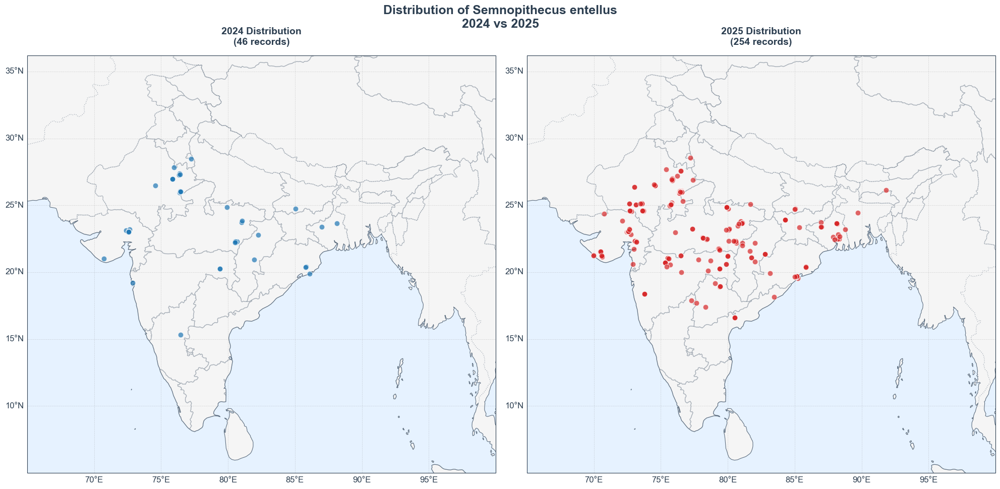

In [113]:
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Load the data
file_path = '/Users/divyadhole/Capstone-project/outputs/occurrence_points_gbif.csv'
df = pd.read_csv(file_path)

# Filter for Semnopithecus entellus
species_name = "Semnopithecus entellus"
species_data = df[df['scientific_name'].str.contains(species_name, case=False, na=False)].copy()

# Convert year to numeric, coerce errors to NaN
species_data['year'] = pd.to_numeric(species_data['year'], errors='coerce')

# Create figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10), 
                             subplot_kw={'projection': ccrs.PlateCarree()})

# Function to plot a single year's data
def plot_year(ax, year_data, year, color, title):
    # Add map features
    ax.add_feature(cfeature.LAND, facecolor='#f5f5f5')
    ax.add_feature(cfeature.OCEAN, facecolor='#e6f2ff')
    ax.add_feature(cfeature.COASTLINE, linewidth=0.8, edgecolor='#5D6D7E')
    ax.add_feature(cfeature.BORDERS, linestyle=':', alpha=0.5, edgecolor='#5D6D7E')
    ax.add_feature(cfeature.STATES, linestyle='-', alpha=0.3, edgecolor='#5D6D7E')
    
    # Plot points
    if not year_data.empty:
        sc = ax.scatter(
            year_data['longitude'],
            year_data['latitude'],
            c=color,
            s=60,
            alpha=0.7,
            edgecolor='white',
            linewidth=0.8,
            transform=ccrs.PlateCarree(),
            zorder=5
        )
    
    # Set title and extent
    ax.set_title(f'{title}\n({len(year_data)} records)', fontsize=14, pad=15, fontweight='bold')
    ax.set_extent([65, 100, 5, 35])  # Focus on India and surrounding areas
    
    # Add gridlines
    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.3, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False

# Filter and plot 2024 data
data_2024 = species_data[species_data['year'] == 2024]
plot_year(ax1, data_2024, 2024, '#1f77b4', '2024 Distribution')

# Filter and plot 2025 data
data_2025 = species_data[species_data['year'] == 2025]
plot_year(ax2, data_2025, 2025, '#d62728', '2025 Distribution')

# Add a title for the entire figure
plt.suptitle(f'Distribution of {species_name}\n2024 vs 2025', 
             fontsize=18, y=0.98, fontweight='bold')

# Adjust layout and save
plt.tight_layout()
output_file = f'/Users/divyadhole/Capstone-project/outputs/species_occurrences/{species_name.replace(" ", "_")}_2024_vs_2025.png'
plt.savefig(output_file, dpi=300, bbox_inches='tight', facecolor='white')
print(f"✅ Saved comparison plot to {output_file}")

plt.show()

In [116]:
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.gridspec import GridSpec

# Load the data
file_path = '/Users/divyadhole/Capstone-project/outputs/occurrence_points_gbif.csv'
df = pd.read_csv(file_path)

# Function to plot comparison maps
def plot_species_comparison(species_name, period1, period2, period1_name, period2_name, figsize=(20, 8)):
    # Filter for the species
    species_data = df[df['scientific_name'].str.contains(species_name, case=False, na=False)].copy()
    species_data['year'] = pd.to_numeric(species_data['year'], errors='coerce')
    
    # Filter for the two periods
    period1_data = species_data[(species_data['year'] >= period1[0]) & (species_data['year'] <= period1[1])]
    period2_data = species_data[(species_data['year'] >= period2[0]) & (species_data['year'] <= period2[1])]
    
    # Create figure
    fig = plt.figure(figsize=figsize)
    gs = GridSpec(1, 2, width_ratios=[1, 1], height_ratios=[1])
    
    # Plot first period
    ax1 = fig.add_subplot(gs[0], projection=ccrs.PlateCarree())
    add_map_features(ax1, period1_data, period1_name, '#1f77b4')
    
    # Plot second period
    ax2 = fig.add_subplot(gs[1], projection=ccrs.PlateCarree())
    add_map_features(ax2, period2_data, period2_name, '#d62728')
    
    # Add main title
    plt.suptitle(f'Distribution of {species_name}\n{period1_name} vs {period2_name}', 
                fontsize=16, y=0.98, fontweight='bold')
    
    # Adjust layout and save
    plt.tight_layout()
    safe_name = species_name.replace(' ', '_').replace('/', '_')
    output_file = f'/Users/divyadhole/Capstone-project/outputs/species_occurrences/{safe_name}_comparison.png'
    plt.savefig(output_file, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"✅ Saved {species_name} comparison plot to {output_file}")
    plt.close()

def add_map_features(ax, data, title, color):
    # Add map features
    ax.add_feature(cfeature.LAND, facecolor='#f5f5f5')
    ax.add_feature(cfeature.OCEAN, facecolor='#e6f2ff')
    ax.add_feature(cfeature.COASTLINE, linewidth=0.8, edgecolor='#5D6D7E')
    ax.add_feature(cfeature.BORDERS, linestyle=':', alpha=0.5, edgecolor='#5D6D7E')
    ax.add_feature(cfeature.STATES, linestyle='-', alpha=0.3, edgecolor='#5D6D7E')
    
    # Plot points
    if not data.empty:
        ax.scatter(
            data['longitude'],
            data['latitude'],
            c=color,
            s=60,
            alpha=0.7,
            edgecolor='white',
            linewidth=0.8,
            transform=ccrs.PlateCarree(),
            zorder=5
        )
    
    # Set title and extent
    ax.set_title(f'{title}\n({len(data)} records)', fontsize=12, pad=15)
    ax.set_extent([65, 100, 5, 35])  # Focus on South Asia
    
    # Add gridlines
    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.3, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False

# 1. Trachypithecus pileatus: 2014-2020 vs 2023-2025
plot_species_comparison(
    'Trachypithecus pileatus',
    (2014, 2020),
    (2023, 2025),
    '2014-2020',
    '2023-2025'
)

# 2. Semnopithecus hypoleucos: 2014-2020 vs 2023-2025
plot_species_comparison(
    'Semnopithecus hypoleucos',
    (2014, 2020),
    (2023, 2025),
    '2014-2020',
    '2023-2025'
)

# 3. Semnopithecus schistaceus: 2024 vs 2025
plot_species_comparison(
    'Semnopithecus schistaceus',
    (2024, 2024),
    (2025, 2025),
    '2024',
    '2025',
    figsize=(20, 10)
)

# 4. Semnopithecus johni: 2022 vs 2024
plot_species_comparison(
    'Semnopithecus johnii',  # Note: Corrected spelling from 'johni' to 'johnii'
    (2022, 2022),
    (2024, 2024),
    '2022',
    '2024',
    figsize=(20, 10)
)

print("All comparison plots have been generated!")

✅ Saved Trachypithecus pileatus comparison plot to /Users/divyadhole/Capstone-project/outputs/species_occurrences/Trachypithecus_pileatus_comparison.png
✅ Saved Semnopithecus hypoleucos comparison plot to /Users/divyadhole/Capstone-project/outputs/species_occurrences/Semnopithecus_hypoleucos_comparison.png
✅ Saved Semnopithecus schistaceus comparison plot to /Users/divyadhole/Capstone-project/outputs/species_occurrences/Semnopithecus_schistaceus_comparison.png
✅ Saved Semnopithecus johnii comparison plot to /Users/divyadhole/Capstone-project/outputs/species_occurrences/Semnopithecus_johnii_comparison.png
All comparison plots have been generated!


✅ Saved Trachypithecus pileatus comparison plot to /Users/divyadhole/Capstone-project/outputs/species_occurrences/Trachypithecus_pileatus_comparison.png


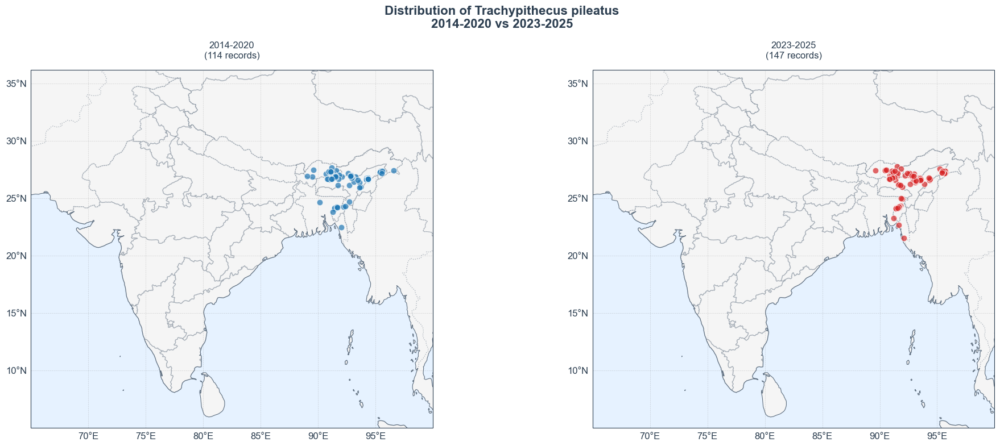

In [118]:
def plot_species_comparison(species_name, period1, period2, period1_name, period2_name, figsize=(20, 8)):
    # Filter for the species
    species_data = df[df['scientific_name'].str.contains(species_name, case=False, na=False)].copy()
    species_data['year'] = pd.to_numeric(species_data['year'], errors='coerce')
    
    # Filter for the two periods
    period1_data = species_data[(species_data['year'] >= period1[0]) & (species_data['year'] <= period1[1])]
    period2_data = species_data[(species_data['year'] >= period2[0]) & (species_data['year'] <= period2[1])]
    
    # Create figure
    fig = plt.figure(figsize=figsize)
    gs = GridSpec(1, 2, width_ratios=[1, 1], height_ratios=[1])
    
    # Plot first period
    ax1 = fig.add_subplot(gs[0], projection=ccrs.PlateCarree())
    add_map_features(ax1, period1_data, period1_name, '#1f77b4')
    
    # Plot second period
    ax2 = fig.add_subplot(gs[1], projection=ccrs.PlateCarree())
    add_map_features(ax2, period2_data, period2_name, '#d62728')
    
    # Add main title
    plt.suptitle(f'Distribution of {species_name}\n{period1_name} vs {period2_name}', 
                fontsize=16, y=0.98, fontweight='bold')
    
    # Adjust layout and save
    plt.tight_layout()
    safe_name = species_name.replace(' ', '_').replace('/', '_')
    output_file = f'/Users/divyadhole/Capstone-project/outputs/species_occurrences/{safe_name}_comparison.png'
    plt.savefig(output_file, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"✅ Saved {species_name} comparison plot to {output_file}")
    # Removed plt.close() to show the plot in the notebook
    plt.show()

# Now when you call the function, it will display the plot in the notebook
plot_species_comparison(
    'Trachypithecus pileatus',
    (2014, 2020),
    (2023, 2025),
    '2014-2020',
    '2023-2025'
)

✅ Saved Trachypithecus pileatus comparison plot to /Users/divyadhole/Capstone-project/outputs/species_occurrences/Trachypithecus_pileatus_comparison.png


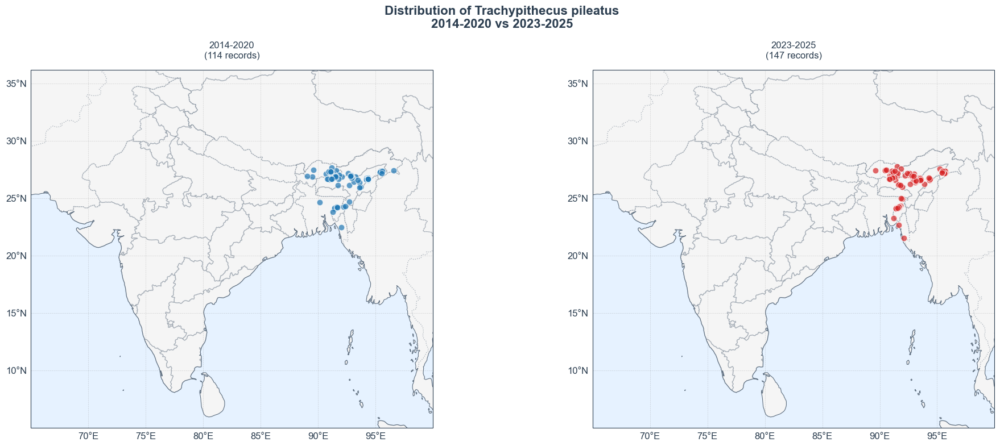

✅ Saved Semnopithecus hypoleucos comparison plot to /Users/divyadhole/Capstone-project/outputs/species_occurrences/Semnopithecus_hypoleucos_comparison.png


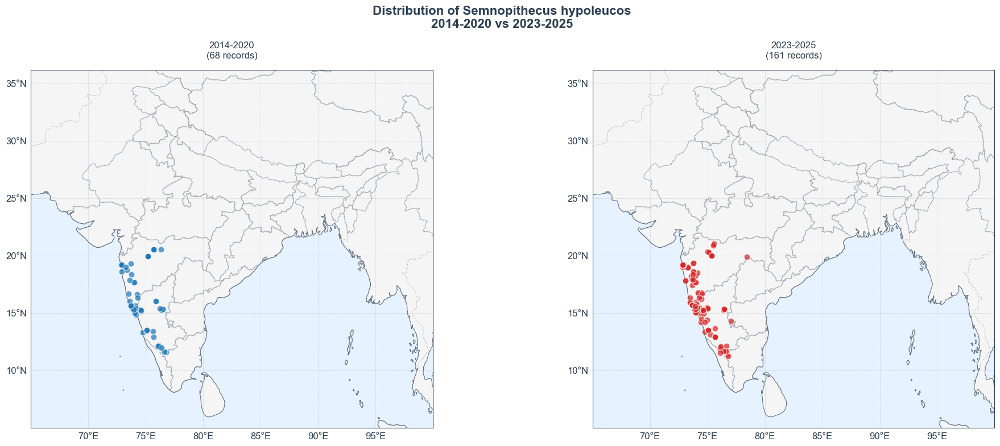

✅ Saved Semnopithecus schistaceus comparison plot to /Users/divyadhole/Capstone-project/outputs/species_occurrences/Semnopithecus_schistaceus_comparison.png


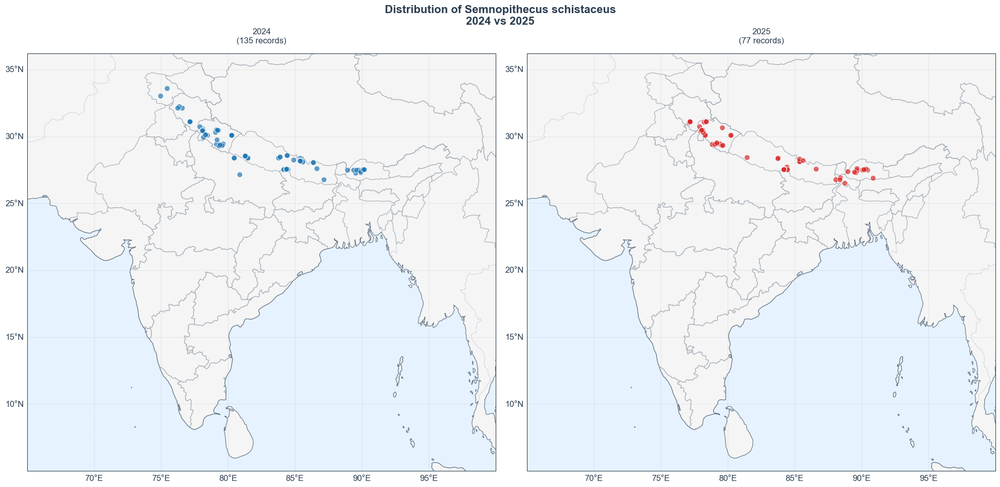

✅ Saved Semnopithecus johnii comparison plot to /Users/divyadhole/Capstone-project/outputs/species_occurrences/Semnopithecus_johnii_comparison.png


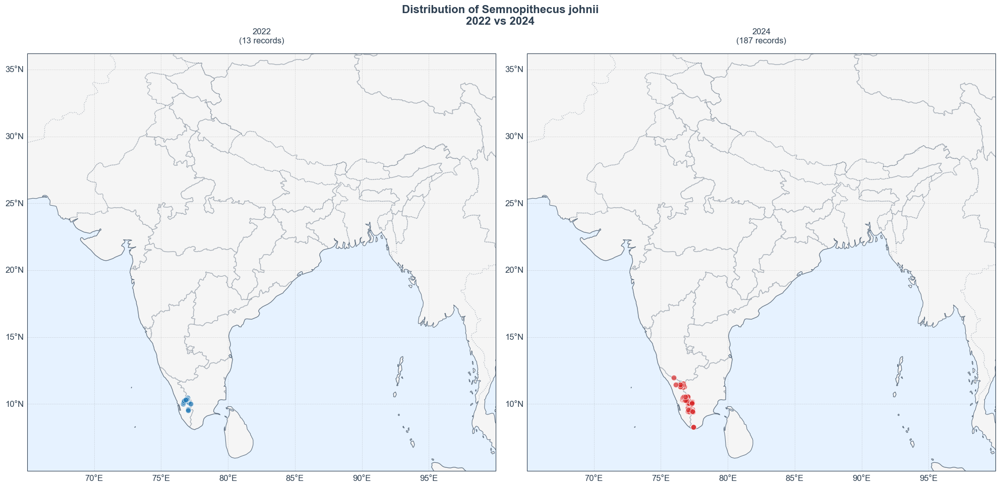

In [119]:
# 1. Trachypithecus pileatus
plot_species_comparison(
    'Trachypithecus pileatus',
    (2014, 2020),
    (2023, 2025),
    '2014-2020',
    '2023-2025'
)

# 2. Semnopithecus hypoleucos
plot_species_comparison(
    'Semnopithecus hypoleucos',
    (2014, 2020),
    (2023, 2025),
    '2014-2020',
    '2023-2025'
)

# 3. Semnopithecus schistaceus
plot_species_comparison(
    'Semnopithecus schistaceus',
    (2024, 2024),
    (2025, 2025),
    '2024',
    '2025',
    figsize=(20, 10)
)

# 4. Semnopithecus johnii
plot_species_comparison(
    'Semnopithecus johnii',
    (2022, 2022),
    (2024, 2024),
    '2022',
    '2024',
    figsize=(20, 10)
)

✅ Saved before/after comparison plot to /Users/divyadhole/Capstone-project/outputs/species_occurrences/species_distribution_before_after.png


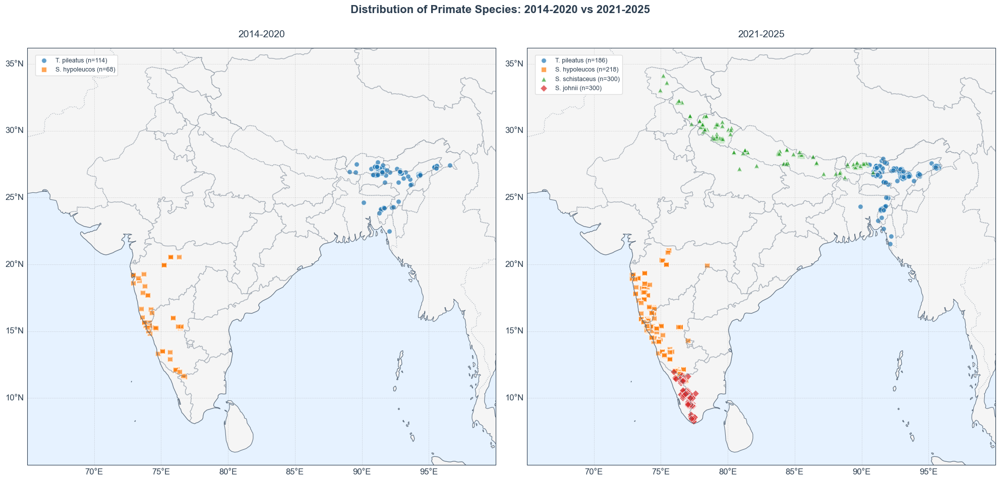

In [121]:
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Load the data
file_path = '/Users/divyadhole/Capstone-project/outputs/occurrence_points_gbif.csv'
df = pd.read_csv(file_path)

# Define species and their colors
species_list = [
    {'name': 'Trachypithecus pileatus', 'color': '#1f77b4', 'marker': 'o', 'label': 'T. pileatus'},
    {'name': 'Semnopithecus hypoleucos', 'color': '#ff7f0e', 'marker': 's', 'label': 'S. hypoleucos'},
    {'name': 'Semnopithecus schistaceus', 'color': '#2ca02c', 'marker': '^', 'label': 'S. schistaceus'},
    {'name': 'Semnopithecus johnii', 'color': '#d62728', 'marker': 'D', 'label': 'S. johnii'}
]

# Create figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10), 
                             subplot_kw={'projection': ccrs.PlateCarree()})

# Function to add map features
def setup_map(ax, title):
    ax.add_feature(cfeature.LAND, facecolor='#f5f5f5')
    ax.add_feature(cfeature.OCEAN, facecolor='#e6f2ff')
    ax.add_feature(cfeature.COASTLINE, linewidth=0.8, edgecolor='#5D6D7E')
    ax.add_feature(cfeature.BORDERS, linestyle=':', alpha=0.5, edgecolor='#5D6D7E')
    ax.add_feature(cfeature.STATES, linestyle='-', alpha=0.3, edgecolor='#5D6D7E')
    ax.set_extent([65, 100, 5, 35])
    ax.set_title(title, fontsize=14, pad=15)
    
    # Add gridlines
    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.3, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    return ax

# Setup maps
ax1 = setup_map(ax1, '2014-2020')
ax2 = setup_map(ax2, '2021-2025')

# Convert year to numeric
df['year'] = pd.to_numeric(df['year'], errors='coerce')

# Plot each species on both maps
for species in species_list:
    # Filter data for the species
    species_data = df[df['scientific_name'].str.contains(species['name'], case=False, na=False)].copy()
    
    # Plot for first period (2014-2020)
    period1_data = species_data[(species_data['year'] >= 2014) & (species_data['year'] <= 2020)]
    if not period1_data.empty:
        ax1.scatter(
            period1_data['longitude'],
            period1_data['latitude'],
            c=species['color'],
            s=50,
            alpha=0.7,
            edgecolor='white',
            linewidth=0.8,
            marker=species['marker'],
            transform=ccrs.PlateCarree(),
            label=f"{species['label']} (n={len(period1_data)})"
        )
    
    # Plot for second period (2021-2025)
    period2_data = species_data[(species_data['year'] >= 2021) & (species_data['year'] <= 2025)]
    if not period2_data.empty:
        ax2.scatter(
            period2_data['longitude'],
            period2_data['latitude'],
            c=species['color'],
            s=50,
            alpha=0.7,
            edgecolor='white',
            linewidth=0.8,
            marker=species['marker'],
            transform=ccrs.PlateCarree(),
            label=f"{species['label']} (n={len(period2_data)})"
        )

# Add legends
ax1.legend(loc='upper left', bbox_to_anchor=(0.01, 0.99), frameon=True, framealpha=1, edgecolor='#dddddd', fontsize=9)
ax2.legend(loc='upper left', bbox_to_anchor=(0.01, 0.99), frameon=True, framealpha=1, edgecolor='#dddddd', fontsize=9)

# Add main title
plt.suptitle('Distribution of Primate Species: 2014-2020 vs 2021-2025', 
             fontsize=16, y=0.98, fontweight='bold')

# Adjust layout and save
plt.tight_layout()
output_file = '/Users/divyadhole/Capstone-project/outputs/species_occurrences/species_distribution_before_after.png'
plt.savefig(output_file, dpi=300, bbox_inches='tight', facecolor='white')
print(f"✅ Saved before/after comparison plot to {output_file}")

plt.show()